# BM9: Understand the Impact of COVID-19 on Mental Health Using Advanced  Machine Learning Techniques

- This dissertation explores the impact of the COVID-19 pandemic on mental health by analyzing large-scale social media data from Reddit. The study employs unsupervised machine learning techniques, including topic modeling and clustering, to uncover shifts in public sentiment and mental health concerns over time. 
- By examining digital traces of discussions related to various mental health topics, such as anxiety, depression, and health anxiety, the research aims to provide insights into how these issues have evolved during different phases of the pandemic, including the introduction of vaccines, new virus strains, and government interventions. The findings are intended to inform therapeutic approaches and policy-making to better address mental health challenges in future public health crises.

In [99]:
!python --version

Python 3.11.4


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


## Importing Libraries
Importing essential libraries for data processing, analysis, and visualization.

1. OS & Requests: For file management and downloading data from online sources. 
2. Pandas & Numpy: For data manipulation and numerical operations.
3. Matplotlib & Seaborn: For creating visualizations.
4. Regex & String: For text processing tasks.
5. Scikit-learn (TfidfVectorizer): For transforming text data into numerical features.
6. NLTK: For natural language processing tasks, such as tokenization, stopword removal, and lemmatization.
7. NLTK Downloads: Ensures required NLP datasets (stopwords, punkt, wordnet) are available.

In [1]:
import os
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import string
import warnings
import itertools

from io import StringIO
from collections import Counter
from wordcloud import WordCloud

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import LatentDirichletAllocation, TruncatedSVD
from sklearn.metrics import silhouette_score, davies_bouldin_score

from nltk.corpus import stopwords, wordnet
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

from gensim.models import CoherenceModel
import gensim
from gensim.corpora.dictionary import Dictionary

from bertopic import BERTopic
import hdbscan
from sentence_transformers import SentenceTransformer

from textblob import TextBlob
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

import plotly.express as px

# Suppress warnings
warnings.filterwarnings("ignore")

# Install any missing packages
!pip install vaderSentiment


/Users/tanyachaudhary/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/tanyachaudhary/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/tanyachaudhary/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/tanyachaudhary/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Defining Data Source
1. Base URL: Specifies the URL of the online repository where the data files are stored.
2. File Names: A list of CSV filenames that need to be loaded from the repository.

In [2]:
# Defining the base URL for the data repository
base_url = 'https://zenodo.org/record/3941387/files/'

# List of filenames to be loaded
file_names = [
    'anxiety_pre_features_tfidf_256.csv',
    'anxiety_post_features_tfidf_256.csv',
    'anxiety_2019_features_tfidf_256.csv',
    'anxiety_2018_features_tfidf_256.csv',
    'depression_pre_features_tfidf_256.csv',
    'depression_post_features_tfidf_256.csv',
    'depression_2019_features_tfidf_256.csv',
    'depression_2018_features_tfidf_256.csv',
    'fitness_pre_features_tfidf_256.csv',
    'fitness_post_features_tfidf_256.csv',
    'fitness_2019_features_tfidf_256.csv',
    'fitness_2018_features_tfidf_256.csv',
    'lonely_pre_features_tfidf_256.csv',
    'lonely_post_features_tfidf_256.csv',
    'lonely_2019_features_tfidf_256.csv',
    'lonely_2018_features_tfidf_256.csv',
    'healthanxiety_pre_features_tfidf_256.csv',
    'healthanxiety_post_features_tfidf_256.csv',
    'healthanxiety_2019_features_tfidf_256.csv',
    'healthanxiety_2018_features_tfidf_256.csv',
    'meditation_pre_features_tfidf_256.csv',
    'meditation_post_features_tfidf_256.csv',
    'meditation_2019_features_tfidf_256.csv',
    'meditation_2018_features_tfidf_256.csv',
    'mentalhealth_pre_features_tfidf_256.csv',
    'mentalhealth_post_features_tfidf_256.csv',
    'mentalhealth_2019_features_tfidf_256.csv',
    'mentalhealth_2018_features_tfidf_256.csv',
    'socialanxiety_pre_features_tfidf_256.csv',
    'socialanxiety_post_features_tfidf_256.csv',
    'socialanxiety_2019_features_tfidf_256.csv',
    'socialanxiety_2018_features_tfidf_256.csv'
]

## Loading Data from Online Repository

- Loading data files for 8 key topics related to mental health, which were selected based on their relevance to the dissertation's objectives.
- These topics—anxiety, depression, divorce, fitness, loneliness, and health anxiety—represent common mental health concerns that have been significantly impacted by the COVID-19 pandemic. 
- The selection of these topics allows for a comprehensive analysis of how public sentiment and mental health-related discussions have evolved over time, providing valuable insights into the broader mental health impacts of the pandemic.

In [3]:
def load_csv_file(file_name):
    url = f'{base_url}{file_name}?download=1'
    response = requests.get(url)
    if response.status_code == 200:
        csv_data = StringIO(response.text)
        return pd.read_csv(csv_data)
    else:
        raise FileNotFoundError(f"Could not retrieve {file_name} from the repository.")

# Loading the datasets into dataframes
df_anxiety_pre = load_csv_file('anxiety_pre_features_tfidf_256.csv')
df_anxiety_post = load_csv_file('anxiety_post_features_tfidf_256.csv')
df_anxiety_2019 = load_csv_file('anxiety_2019_features_tfidf_256.csv')
df_anxiety_2018 = load_csv_file('anxiety_2018_features_tfidf_256.csv')

df_depression_pre = load_csv_file('depression_pre_features_tfidf_256.csv')
df_depression_post = load_csv_file('depression_post_features_tfidf_256.csv')
df_depression_2019 = load_csv_file('depression_2019_features_tfidf_256.csv')
df_depression_2018 = load_csv_file('depression_2018_features_tfidf_256.csv')

df_fitness_pre = load_csv_file('fitness_pre_features_tfidf_256.csv')
df_fitness_post = load_csv_file('fitness_post_features_tfidf_256.csv')
df_fitness_2019 = load_csv_file('fitness_2019_features_tfidf_256.csv')
df_fitness_2018 = load_csv_file('fitness_2018_features_tfidf_256.csv')

df_lonely_pre = load_csv_file('lonely_pre_features_tfidf_256.csv')
df_lonely_post = load_csv_file('lonely_post_features_tfidf_256.csv')
df_lonely_2019 = load_csv_file('lonely_2019_features_tfidf_256.csv')
df_lonely_2018 = load_csv_file('lonely_2018_features_tfidf_256.csv')

df_healthanxiety_pre = load_csv_file('healthanxiety_pre_features_tfidf_256.csv')
df_healthanxiety_post = load_csv_file('healthanxiety_post_features_tfidf_256.csv')
df_healthanxiety_2019 = load_csv_file('healthanxiety_2019_features_tfidf_256.csv')
df_healthanxiety_2018 = load_csv_file('healthanxiety_2018_features_tfidf_256.csv')

df_meditation_pre = load_csv_file('meditation_pre_features_tfidf_256.csv')
df_meditation_post = load_csv_file('meditation_post_features_tfidf_256.csv')
df_meditation_2019 = load_csv_file('meditation_2019_features_tfidf_256.csv')
df_meditation_2018 = load_csv_file('meditation_2018_features_tfidf_256.csv')

df_mentalhealth_pre = load_csv_file('mentalhealth_pre_features_tfidf_256.csv')
df_mentalhealth_post = load_csv_file('mentalhealth_post_features_tfidf_256.csv')
df_mentalhealth_2019 = load_csv_file('mentalhealth_2019_features_tfidf_256.csv')
df_mentalhealth_2018 = load_csv_file('mentalhealth_2018_features_tfidf_256.csv')

df_socialanxiety_pre = load_csv_file('socialanxiety_pre_features_tfidf_256.csv')
df_socialanxiety_post = load_csv_file('socialanxiety_post_features_tfidf_256.csv')
df_socialanxiety_2019 = load_csv_file('socialanxiety_2019_features_tfidf_256.csv')
df_socialanxiety_2018 = load_csv_file('socialanxiety_2018_features_tfidf_256.csv')

###  Removing Non-Essential Columns
- This section defines a function to retain only the first four columns ('subreddit', 'author', 'date', 'post') from the data frames, which are critical for further analysis. 
- The retained columns are essential for understanding the context and timing of the discussions related to mental health topics.
- The function is applied to a list of data frames covering various mental health topics across different time periods,ensuring consistency in the data structure before proceeding with analysis.

In [4]:
def retain_first_four_columns(df):
    return df.iloc[:, :4]

dataframes = [
    df_depression_pre, df_depression_post, df_depression_2019, df_depression_2018,
    df_anxiety_pre, df_anxiety_post, df_anxiety_2019, df_anxiety_2018,
    df_fitness_pre, df_fitness_post, df_fitness_2019, df_fitness_2018,
    df_lonely_pre, df_lonely_post, df_lonely_2019, df_lonely_2018,
    df_healthanxiety_pre, df_healthanxiety_post, df_healthanxiety_2019, df_healthanxiety_2018,
    df_meditation_pre, df_meditation_post, df_meditation_2019, df_meditation_2018,
    df_mentalhealth_pre, df_mentalhealth_post, df_mentalhealth_2019, df_mentalhealth_2018,
    df_socialanxiety_pre, df_socialanxiety_post, df_socialanxiety_2019, df_socialanxiety_2018
]
for i in range(len(dataframes)):
    dataframes[i] = retain_first_four_columns(dataframes[i])
(
    df_depression_pre, df_depression_post, df_depression_2019, df_depression_2018,
    df_anxiety_pre, df_anxiety_post, df_anxiety_2019, df_anxiety_2018,
    df_fitness_pre, df_fitness_post, df_fitness_2019, df_fitness_2018,
    df_lonely_pre, df_lonely_post, df_lonely_2019, df_lonely_2018,
    df_healthanxiety_pre, df_healthanxiety_post, df_healthanxiety_2019, df_healthanxiety_2018,
    df_meditation_pre, df_meditation_post, df_meditation_2019, df_meditation_2018,
    df_mentalhealth_pre, df_mentalhealth_post, df_mentalhealth_2019, df_mentalhealth_2018,
    df_socialanxiety_pre, df_socialanxiety_post, df_socialanxiety_2019, df_socialanxiety_2018
) = dataframes

### Combining Data Frames
- In this section, data frames from various mental health topics and time periods are combined into a single unified data frame.
- A 'period' column is added to distinguish between the different time periods (e.g., 'pre', 'post', '2019', '2018').
- This combined data frame consolidates all the necessary information, facilitating subsequent analysis of mental health trends across different periods.

In [5]:
dfs = [df_depression_pre, df_depression_post, df_depression_2019, df_depression_2018,
       df_anxiety_pre, df_anxiety_post, df_anxiety_2019, df_anxiety_2018,
       df_fitness_pre, df_fitness_post, df_fitness_2019, df_fitness_2018,
       df_lonely_pre, df_lonely_post, df_lonely_2019, df_lonely_2018,
       df_healthanxiety_pre, df_healthanxiety_post, df_healthanxiety_2019, df_healthanxiety_2018,
       df_meditation_pre, df_meditation_post, df_meditation_2019, df_meditation_2018,
       df_mentalhealth_pre, df_mentalhealth_post, df_mentalhealth_2019, df_mentalhealth_2018,
       df_socialanxiety_pre, df_socialanxiety_post, df_socialanxiety_2019, df_socialanxiety_2018]

periods = ['pre', 'post', '2019', '2018']

for i, df in enumerate(dfs):
    df['period'] = periods[i % 4]

df_combined = pd.concat(dfs, ignore_index=True)

In [6]:
df_combined

,subreddit,author,date,post,period
0,depression,What_I_do_45,2019/08/28,I want to enjoy relationships with people but ...,pre
1,depression,Bleumoon_Selene,2019/08/28,I didn't ask to be here. I didn't ask to be bo...,pre
2,depression,Karuderu,2019/08/28,"I don't know, If i can't handle anything anymo...",pre
3,depression,ThisNotMyMainAcc,2019/08/28,I want to know what it feels like to feel genu...,pre
4,depression,edgelord3045,2019/08/28,It doesn't even matter I know this will most l...,pre
...,...,...,...,...,...
341927,socialanxiety,Weirdcowboy,2018/04/20,"Dreading graduation, so many regrets I basical...",2018
341928,socialanxiety,TristanZH,2018/04/20,Anyone else use to have sa and depression... ....,2018
341929,socialanxiety,typicallythrownaway,2018/04/20,Can't stop over analyzing I'm in a classroom e...,2018
341930,socialanxiety,InnerSpeaker420,2018/04/20,Should I ask her to prom? Hi everyone! This is...,2018


## DataFrame Summary and Structure
1. Descriptive Statistics (df_combined.describe(include='all')): Provides an overview of the dataset, including the count, unique values, top occurrences, and frequency for each column.
2. DataFrame Info (df_combined.info()): Displays the structure of the DataFrame, including the number of entries, column names, non-null counts, and data types.


In [7]:
df_combined.describe(include='all')

,subreddit,author,date,post,period
count,341932,341932,341932,341932,341932
unique,8,262810,587,314066,4
top,depression,zensama,2019/03/19,has anyone taken olanzapine/zyprexa or valproa...,pre
freq,117331,16,1588,6,118206


In [8]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 341932 entries, 0 to 341931
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   subreddit  341932 non-null  object
 1   author     341932 non-null  object
 2   date       341932 non-null  object
 3   post       341932 non-null  object
 4   period     341932 non-null  object
dtypes: object(5)
memory usage: 13.0+ MB


### Visualizing the Number of Posts by Topic and Period befor sampling data and time-period grouping .
- This visualization helps in understanding the distribution and changes in the volume of discussions related to various mental health topics before, during, and after the COVID-19 pandemic.

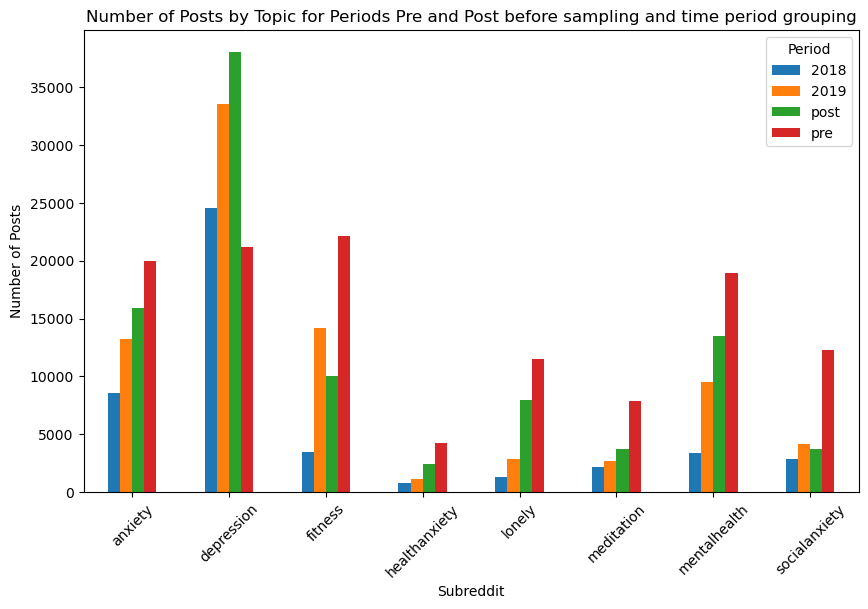

In [9]:
df_counts = df_combined.groupby(['subreddit', 'period']).size().unstack(fill_value=0)
df_counts.plot(kind='bar', figsize=(10, 6))

plt.title('Number of Posts by Topic for Periods Pre and Post before sampling and time period grouping')
plt.xlabel('Subreddit')
plt.ylabel('Number of Posts')
plt.xticks(rotation=45)

plt.legend(title='Period')
plt.show()

### Stratified Sampling
- This section defines a function for stratified sampling, ensuring that each mental health topic and time period is proportionally represented in the sample. The function is then applied to the combined data frame, creating a sample of 2000 posts per group, which will be used for further analysis.

In [10]:
def stratified_sample_df(df, group_cols, sample_size):
    grouped = df.groupby(group_cols)
    sampled_dfs = []

    for key, group in grouped:
        if len(group) < sample_size:
            sampled_dfs.append(group)
        else:
            sampled_dfs.append(group.sample(n=sample_size, random_state=42))

    return pd.concat(sampled_dfs, ignore_index=True)

# Applying stratified sampling
df_sampled = stratified_sample_df(df_combined, ['subreddit', 'period'], 2000)

In [11]:
df_sampled

,subreddit,author,date,post,period
0,anxiety,BumblerMufflin,2018/03/01,Could bullying in my childhood be causing my i...,2018
1,anxiety,Diableriie,2018/01/12,Zoloft side effects question So I recently sta...,2018
2,anxiety,OverthinkThings123,2018/04/20,Does anyone else overthink things to a harmful...,2018
3,anxiety,papilio-bianor,2018/01/03,Welcome back anxiety Do you also have this dis...,2018
4,anxiety,Angrama,2018/03/18,"I don't know if this is related to anxiety, bu...",2018
...,...,...,...,...,...
61277,socialanxiety,Hildarious,2019/06/02,Stayed home alone while my family are at a wat...,pre
61278,socialanxiety,Music9393,2018/11/15,Anxious when visiting parents and relatives I ...,pre
61279,socialanxiety,summerfield,2018/11/04,Girlfriend broke up with me because I avoided ...,pre
61280,socialanxiety,huliehooper,2019/01/10,Advice: what gets me through.. People aren’t l...,pre


### Date Conversion and Period Categorization
- In this section, the 'date' column is converted to datetime format, and a new 'period' column is created by categorizing posts into 'pre' or 'post' periods based on the year. This ensures that the data is correctly aligned with the time periods of interest for analyzing changes in mental health discussions.

In [12]:
df_sampled['date'] = pd.to_datetime(df_sampled['date'], format='%Y/%m/%d')
def categorize_period(date):
    if date.year <= 2018:
        return 'pre'
    else:
        return 'post'

# Applying the function to create a new period column
df_sampled['period'] = df_sampled['date'].apply(categorize_period)

## Data Cleaning: Removing Duplicates and Checking for Null Values
- In this section, the data is cleaned by first identifying and removing any duplicate entries.
- After duplicates are removed, the data is checked for any missing values to ensure data integrity.
- This cleaned dataset will be used for subsequent analysis, ensuring accuracy and consistency.

In [13]:
df_sampled.duplicated().sum()

1248

In [14]:
df_sampled_cleaned = df_sampled.drop_duplicates()

In [15]:
df_sampled_cleaned.duplicated().sum()

0

In [16]:
df_sampled_cleaned.isna().sum()

subreddit    0
author       0
date         0
post         0
period       0
dtype: int64

In [17]:
df_sampled_cleaned

,subreddit,author,date,post,period
0,anxiety,BumblerMufflin,2018-03-01,Could bullying in my childhood be causing my i...,pre
1,anxiety,Diableriie,2018-01-12,Zoloft side effects question So I recently sta...,pre
2,anxiety,OverthinkThings123,2018-04-20,Does anyone else overthink things to a harmful...,pre
3,anxiety,papilio-bianor,2018-01-03,Welcome back anxiety Do you also have this dis...,pre
4,anxiety,Angrama,2018-03-18,"I don't know if this is related to anxiety, bu...",pre
...,...,...,...,...,...
61277,socialanxiety,Hildarious,2019-06-02,Stayed home alone while my family are at a wat...,post
61278,socialanxiety,Music9393,2018-11-15,Anxious when visiting parents and relatives I ...,pre
61279,socialanxiety,summerfield,2018-11-04,Girlfriend broke up with me because I avoided ...,pre
61280,socialanxiety,huliehooper,2019-01-10,Advice: what gets me through.. People aren’t l...,post


## Visualizing the Number of Posts After Sampling
- After cleaning and sampling, this section groups the data by mental health topic ('subreddit') and time period ('period').
- A bar plot is generated to visualize the number of posts for each topic across the different periods, with annotations added for clarity. - This visualization helps in comparing the volume of discussions before and after significant events related to COVID-19.

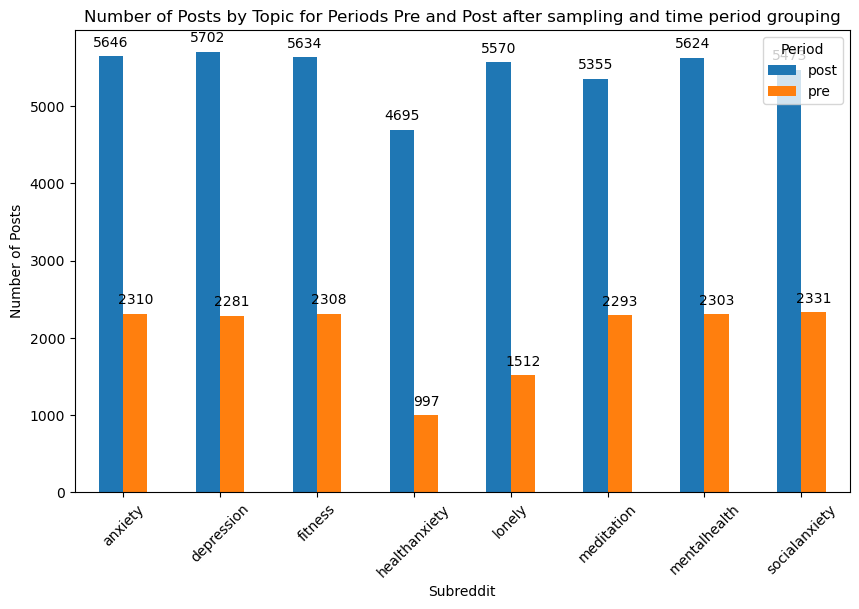

In [18]:
df_counts = df_sampled_cleaned.groupby(['subreddit', 'period']).size().unstack(fill_value=0)
df_counts.plot(kind='bar', figsize=(10, 6))

plt.title('Number of Posts by Topic for Periods Pre and Post after sampling and time period grouping')
plt.xlabel('Subreddit')
plt.ylabel('Number of Posts')
plt.xticks(rotation=45)

ax = plt.gca()  
for p in ax.patches:  
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.legend(title='Period')
plt.show()

## Preprocessing the Data
- In this section, a function is defined to preprocess the text data from the posts. 
- The preprocessing steps include:
1. Removing URLs and HTML tags
2. Converting text to lowercase
3. Removing punctuation, stopwords, and short words
4. Tokenizing the text and lemmatizing the tokens
- These steps clean and standardize the text, making it suitable for subsequent analysis, such as topic modeling and sentiment analysis.
- The preprocessing function is then applied to the 'post' column, creating a new column 'clean_post' containing the cleaned text.

In [19]:
def preprocess_text(text):
    # Remove URLs
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    
    # Remove HTML tags
    text = re.sub(r'<.*?>', '', text)
    
    # Convert to lowercase
    text = text.lower()
    
    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    
    # Tokenize
    tokens = word_tokenize(text)
    
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    
    # Remove short words
    tokens = [word for word in tokens if len(word) > 2]
    
    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(word, get_wordnet_pos(word)) for word in tokens]
    
    # Joining tokens back into string
    cleaned_text = ' '.join(lemmatized_tokens)
    
    return cleaned_text

def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)

In [20]:
df_sampled_cleaned['clean_post'] = df_sampled_cleaned['post'].apply(preprocess_text)

In [21]:
df_sampled_cleaned

,subreddit,author,date,post,period,clean_post
0,anxiety,BumblerMufflin,2018-03-01,Could bullying in my childhood be causing my i...,pre,could bullying childhood cause issue adulthood...
1,anxiety,Diableriie,2018-01-12,Zoloft side effects question So I recently sta...,pre,zoloft side effect question recently start tak...
2,anxiety,OverthinkThings123,2018-04-20,Does anyone else overthink things to a harmful...,pre,anyone else overthink thing harmful extent go ...
3,anxiety,papilio-bianor,2018-01-03,Welcome back anxiety Do you also have this dis...,pre,welcome back anxiety also disturb feel gut com...
4,anxiety,Angrama,2018-03-18,"I don't know if this is related to anxiety, bu...",pre,dont know related anxiety feel like feel physi...
...,...,...,...,...,...,...
61277,socialanxiety,Hildarious,2019-06-02,Stayed home alone while my family are at a wat...,post,stayed home alone family water park celebrate ...
61278,socialanxiety,Music9393,2018-11-15,Anxious when visiting parents and relatives I ...,pre,anxious visit parent relative another country ...
61279,socialanxiety,summerfield,2018-11-04,Girlfriend broke up with me because I avoided ...,pre,girlfriend broke avoid play cranium go girlfri...
61280,socialanxiety,huliehooper,2019-01-10,Advice: what gets me through.. People aren’t l...,post,advice get people look judging every tiny deta...


## EDA (Exploratory Data Analysis)

- Below, sentiment analysis is performed on the cleaned text data using the TextBlob library.
- A function is defined to determine the sentiment polarity of each post, categorizing it as positive, negative, or neutral.
- The sentiment and corresponding polarity scores are then added as new columns to the data frame.
- This analysis provides insight into the overall emotional tone of the discussions, which is crucial for understanding how different mental health topics are perceived and discussed during various periods.

In [22]:
def get_sentiment(text):
    blob = TextBlob(text)
    polarity = blob.sentiment.polarity
    if polarity > 0:
        return 'positive', polarity
    elif polarity == 0:
        return 'neutral', polarity
    else:
        return 'negative', polarity

df_sampled_cleaned['sentiment'], df_sampled_cleaned['polarity'] = zip(*df_sampled_cleaned['post'].apply(get_sentiment))

In [23]:
df_sampled_cleaned

,subreddit,author,date,post,period,clean_post,sentiment,polarity
0,anxiety,BumblerMufflin,2018-03-01,Could bullying in my childhood be causing my i...,pre,could bullying childhood cause issue adulthood...,positive,0.042376
1,anxiety,Diableriie,2018-01-12,Zoloft side effects question So I recently sta...,pre,zoloft side effect question recently start tak...,negative,-0.129437
2,anxiety,OverthinkThings123,2018-04-20,Does anyone else overthink things to a harmful...,pre,anyone else overthink thing harmful extent go ...,negative,-0.018613
3,anxiety,papilio-bianor,2018-01-03,Welcome back anxiety Do you also have this dis...,pre,welcome back anxiety also disturb feel gut com...,negative,-0.012576
4,anxiety,Angrama,2018-03-18,"I don't know if this is related to anxiety, bu...",pre,dont know related anxiety feel like feel physi...,negative,-0.093228
...,...,...,...,...,...,...,...,...
61277,socialanxiety,Hildarious,2019-06-02,Stayed home alone while my family are at a wat...,post,stayed home alone family water park celebrate ...,negative,-0.045779
61278,socialanxiety,Music9393,2018-11-15,Anxious when visiting parents and relatives I ...,pre,anxious visit parent relative another country ...,positive,0.273077
61279,socialanxiety,summerfield,2018-11-04,Girlfriend broke up with me because I avoided ...,pre,girlfriend broke avoid play cranium go girlfri...,positive,0.060000
61280,socialanxiety,huliehooper,2019-01-10,Advice: what gets me through.. People aren’t l...,post,advice get people look judging every tiny deta...,positive,0.214286


## Pie Chart Visualization of Sentiment Distribution
- This section creates a pie chart to visualize the overall distribution of sentiments (positive, negative, neutral) across all the posts in the dataset. 
- The chart helps in understanding the proportion of each sentiment category, providing a high-level overview of the emotional tone present in the discussions.

In [24]:
fig = px.pie(data_frame = df_sampled_cleaned, names = 'sentiment', title = 'Sentiment Distribution', hole = 0.2)
fig.show()

## Bar Plot Visualization of Sentiment Counts
- In this section, a bar plot is generated to visualize the count of each sentiment (positive, negative, neutral).
- This plot provides a clear comparison of the frequency of different sentiments in the dataset, allowing for a more detailed understanding of the sentiment distribution.

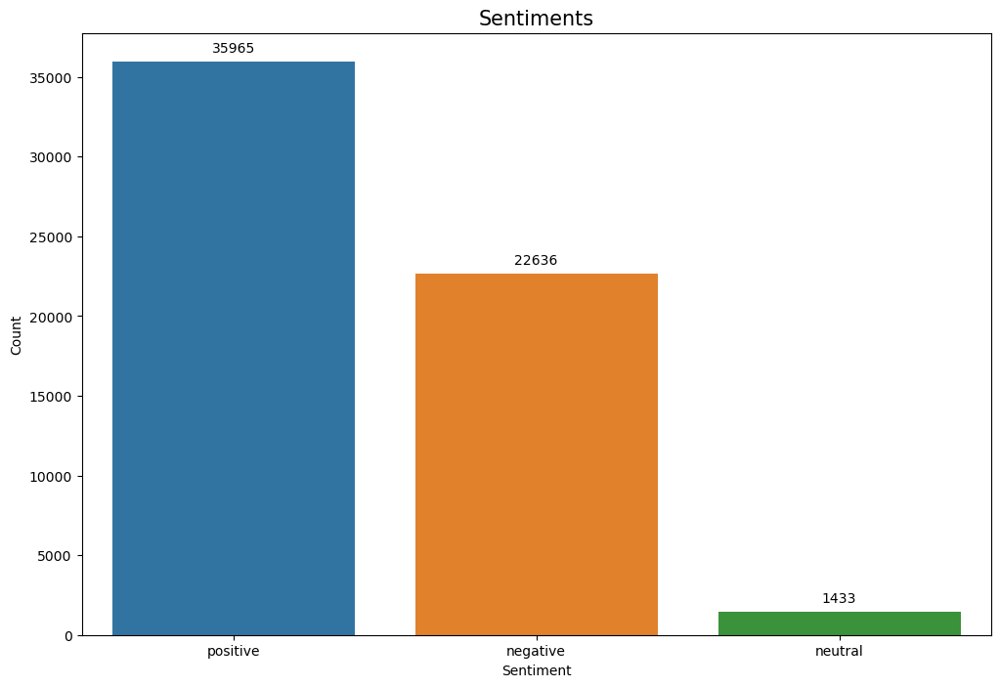

In [25]:
plt.figure(figsize=(12, 8))
sns.countplot(x='sentiment', data=df_sampled_cleaned)
plt.title("Sentiments", fontdict={'fontsize': 15})
plt.ylabel("Count")
plt.xlabel("Sentiment")

for p in plt.gca().patches:
    plt.gca().annotate(f'{int(p.get_height())}', 
                       (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha='center', va='center', 
                       xytext=(0, 10), 
                       textcoords='offset points')

plt.show()

## Sentiment Over Time Analysis
- This section analyzes how sentiments have changed over time by grouping the data by month and year.
- A line plot is generated to visualize the trend of positive, negative, and neutral sentiments over the specified period.
- This time series analysis is crucial for understanding the temporal dynamics of public sentiment, particularly in relation to key events during the COVID-19 pandemic.

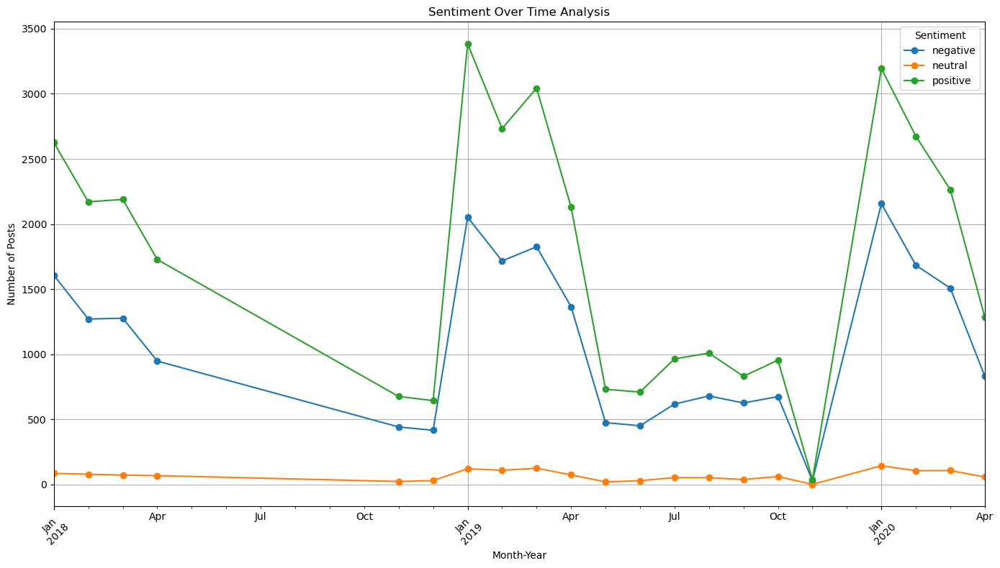

In [26]:
# Ensure the 'date' column is in datetime format
df_sampled_cleaned['date'] = pd.to_datetime(df_sampled_cleaned['date'])

# Extract the month and year for grouping
df_sampled_cleaned['month_year'] = df_sampled_cleaned['date'].dt.to_period('M')

# Group by the month-year and sentiment category
sentiment_over_time = df_sampled_cleaned.groupby(['month_year', 'sentiment']).size().unstack().fillna(0)

# Plotting the sentiment over time
plt.figure(figsize=(14, 8))
sentiment_over_time.plot(kind='line', marker='o', linestyle='-', ax=plt.gca())
plt.title('Sentiment Over Time Analysis')
plt.xlabel('Month-Year')
plt.ylabel('Number of Posts')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend(title='Sentiment')
plt.tight_layout()
plt.show()

While the predominance of positive sentiment might seem unexpected, it underscores the multifaceted role of online mental health communities. These platforms serve not only as outlets for expressing distress but also as spaces for sharing recovery stories, offering support, and discussing coping strategies. The limitations of sentiment analysis tools suggest that further qualitative analysis may be necessary to fully understand the emotional depth of these discussions.

## Encoding Sentiment and Creating Token Lists
- In this section, the sentiment labels ('positive', 'negative', 'neutral') are encoded as numeric values using LabelEncoder to facilitate machine learning processes.
- Additionally, a new column called 'temp_list' is created, which contains a list of tokens (words) from the 'clean_post' column. This transformation is essential for further text analysis tasks such as word frequency analysis or model training.

In [27]:
labelEncoder_X = LabelEncoder()
df_sampled_cleaned['sentiment'] = labelEncoder_X.fit_transform(df_sampled_cleaned['sentiment'])
df_sampled_cleaned.head(5)

,subreddit,author,date,post,period,clean_post,sentiment,polarity,month_year
0,anxiety,BumblerMufflin,2018-03-01,Could bullying in my childhood be causing my i...,pre,could bullying childhood cause issue adulthood...,2,0.042376,2018-03
1,anxiety,Diableriie,2018-01-12,Zoloft side effects question So I recently sta...,pre,zoloft side effect question recently start tak...,0,-0.129437,2018-01
2,anxiety,OverthinkThings123,2018-04-20,Does anyone else overthink things to a harmful...,pre,anyone else overthink thing harmful extent go ...,0,-0.018613,2018-04
3,anxiety,papilio-bianor,2018-01-03,Welcome back anxiety Do you also have this dis...,pre,welcome back anxiety also disturb feel gut com...,0,-0.012576,2018-01
4,anxiety,Angrama,2018-03-18,"I don't know if this is related to anxiety, bu...",pre,dont know related anxiety feel like feel physi...,0,-0.093228,2018-03


In [28]:
df_sampled_cleaned['temp_list'] = df_sampled_cleaned['clean_post'].apply(lambda x:str(x).split())

In [29]:
df_sampled_cleaned

,subreddit,author,date,post,period,clean_post,sentiment,polarity,month_year,temp_list
0,anxiety,BumblerMufflin,2018-03-01,Could bullying in my childhood be causing my i...,pre,could bullying childhood cause issue adulthood...,2,0.042376,2018-03,"[could, bullying, childhood, cause, issue, adu..."
1,anxiety,Diableriie,2018-01-12,Zoloft side effects question So I recently sta...,pre,zoloft side effect question recently start tak...,0,-0.129437,2018-01,"[zoloft, side, effect, question, recently, sta..."
2,anxiety,OverthinkThings123,2018-04-20,Does anyone else overthink things to a harmful...,pre,anyone else overthink thing harmful extent go ...,0,-0.018613,2018-04,"[anyone, else, overthink, thing, harmful, exte..."
3,anxiety,papilio-bianor,2018-01-03,Welcome back anxiety Do you also have this dis...,pre,welcome back anxiety also disturb feel gut com...,0,-0.012576,2018-01,"[welcome, back, anxiety, also, disturb, feel, ..."
4,anxiety,Angrama,2018-03-18,"I don't know if this is related to anxiety, bu...",pre,dont know related anxiety feel like feel physi...,0,-0.093228,2018-03,"[dont, know, related, anxiety, feel, like, fee..."
...,...,...,...,...,...,...,...,...,...,...
61277,socialanxiety,Hildarious,2019-06-02,Stayed home alone while my family are at a wat...,post,stayed home alone family water park celebrate ...,0,-0.045779,2019-06,"[stayed, home, alone, family, water, park, cel..."
61278,socialanxiety,Music9393,2018-11-15,Anxious when visiting parents and relatives I ...,pre,anxious visit parent relative another country ...,2,0.273077,2018-11,"[anxious, visit, parent, relative, another, co..."
61279,socialanxiety,summerfield,2018-11-04,Girlfriend broke up with me because I avoided ...,pre,girlfriend broke avoid play cranium go girlfri...,2,0.060000,2018-11,"[girlfriend, broke, avoid, play, cranium, go, ..."
61280,socialanxiety,huliehooper,2019-01-10,Advice: what gets me through.. People aren’t l...,post,advice get people look judging every tiny deta...,2,0.214286,2019-01,"[advice, get, people, look, judging, every, ti..."


## Top 30 Words and Their Frequency for Each Topic
- In this section, a function is defined to extract the top `n` most common words for a given mental health topic.
- The function first filters the data frame to isolate posts related to the specific topic, then flattens the list of words and counts their frequencies. The top `n` words are then returned.
- The unique topics are identified, and the function is applied to each topic to create a dictionary storing the top words for each one.
- Finally, the top 30 words and their frequencies for each topic are displayed, providing insights into the most discussed themes within each mental health topic.

In [30]:
def get_top_words(df, topic, n=30):
   
    df_topic = df[df['subreddit'] == topic]
    words = list(itertools.chain(*df_topic['temp_list']))
    word_counts = Counter(words)
    top_words = word_counts.most_common(n)
    
    return top_words

# Getting the unique topics
unique_topics = df_sampled_cleaned['subreddit'].unique()

In [31]:
top_words_per_topic = {}
for topic in unique_topics:
    top_words_per_topic[topic] = get_top_words(df_sampled_cleaned, topic)

In [32]:
# Displaying the top words for each topic
for topic, words in top_words_per_topic.items():
    print(f"Top 30 words for topic '{topic}':")
    for word, count in words:
        print(f"{word}: {count}")
    print("\n")

Top 30 words for topic 'anxiety':
anxiety: 12225
get: 10883
feel: 10612
like: 9329
know: 5985
go: 5679
time: 5556
make: 5164
want: 4837
really: 4718
day: 4319
think: 4306
work: 4259
dont: 4148
help: 3956
thing: 3949
bad: 3886
start: 3832
even: 3770
take: 3731
ive: 3623
year: 3555
people: 3434
try: 3396
say: 3197
one: 3114
anyone: 3042
would: 3042
attack: 3024
something: 2866


Top 30 words for topic 'depression':
feel: 13225
like: 10864
get: 10215
want: 8348
know: 7460
dont: 7011
life: 6666
time: 5785
make: 5605
even: 5047
go: 5009
year: 4959
friend: 4684
people: 4626
day: 4521
really: 4518
thing: 4450
think: 4430
depression: 4259
ive: 4129
try: 4121
one: 3991
help: 3722
well: 3621
bad: 3557
would: 3541
cant: 3496
work: 3434
say: 3297
never: 3121


Top 30 words for topic 'fitness':
day: 6483
get: 6303
weight: 6100
week: 4427
like: 4414
work: 4396
start: 4175
gym: 4002
time: 3959
workout: 3821
ive: 3455
lift: 3364
muscle: 3326
would: 3282
want: 3269
body: 3157
exercise: 2970
year: 2905


## Word Clouds for Each Topic
- In this section, word clouds are generated for each mental health topic based on the frequency of the top words.
- The word clouds visually represent the most common words in the discussions related to each topic, with the size of each word indicating its frequency. This helps in quickly identifying the key themes and topics of concern within each mental health category.
- The word clouds are displayed for each topic, providing an intuitive way to explore the most prominent words.

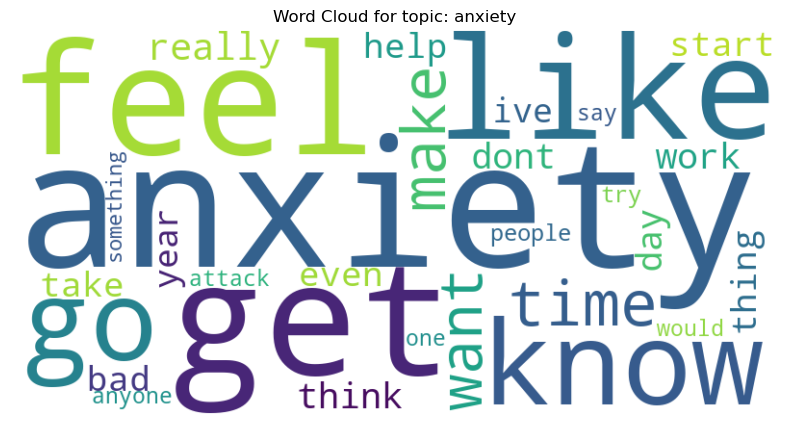

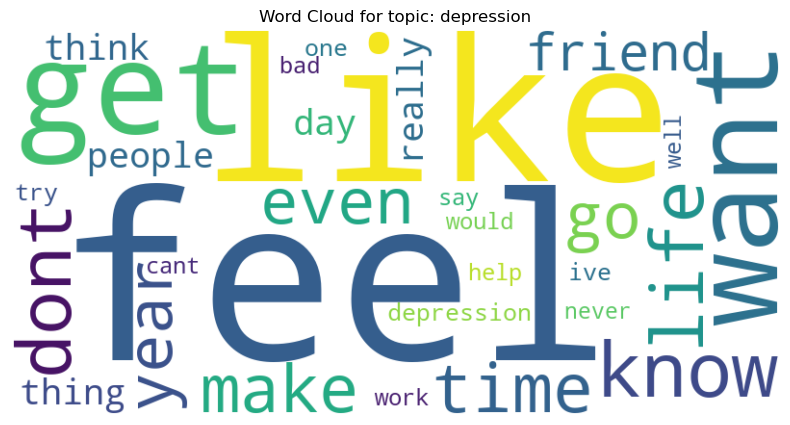

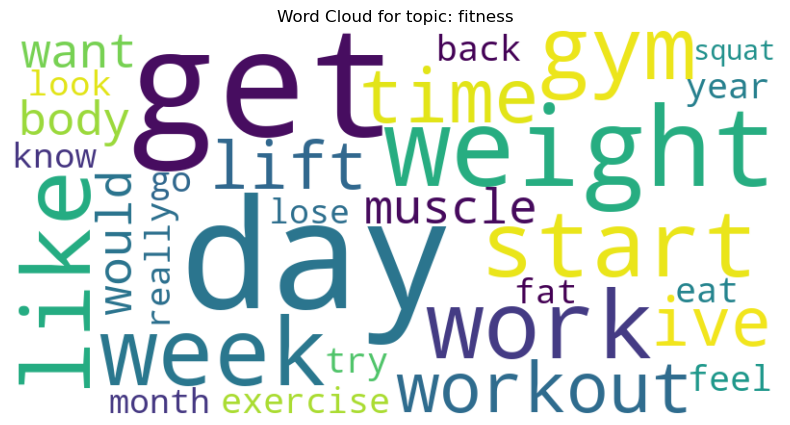

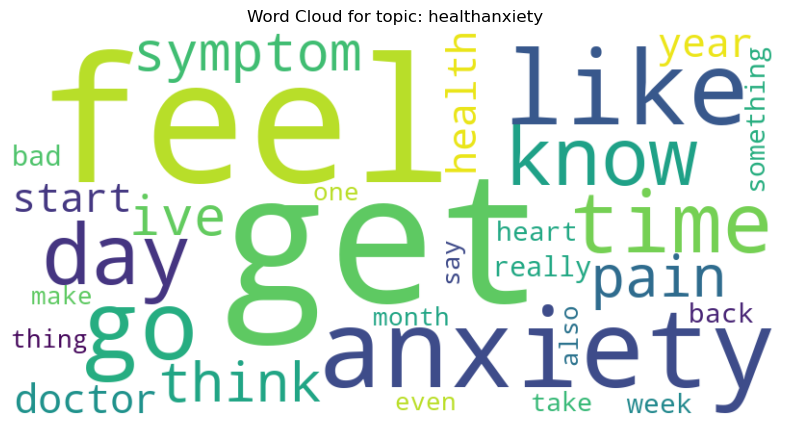

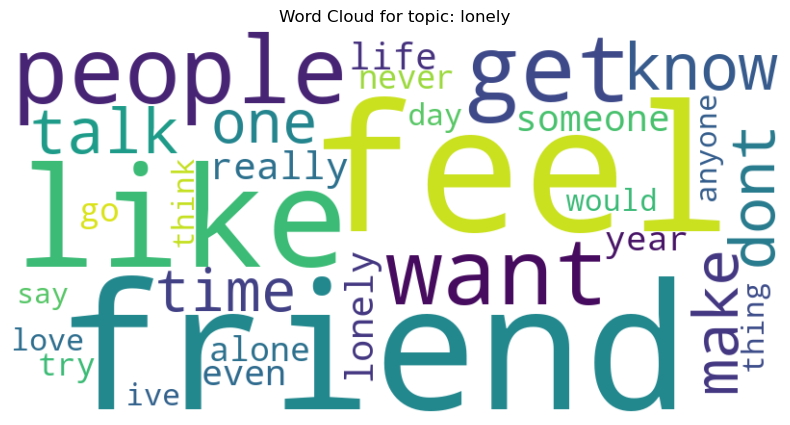

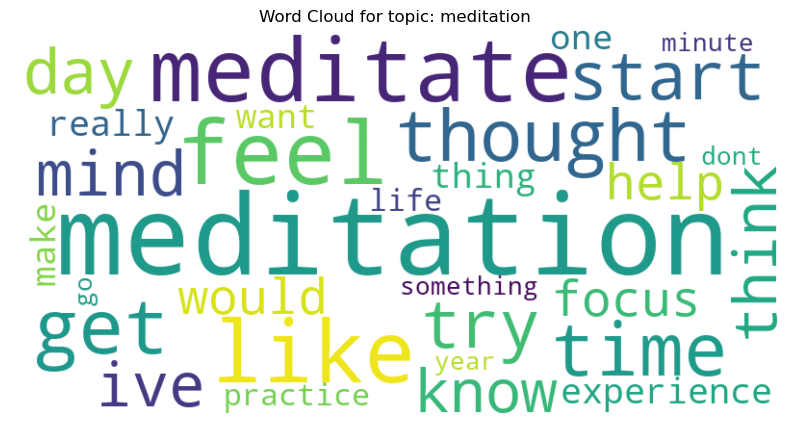

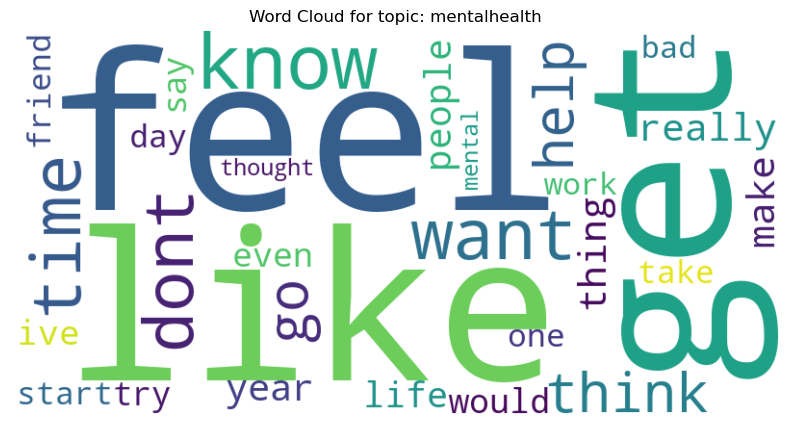

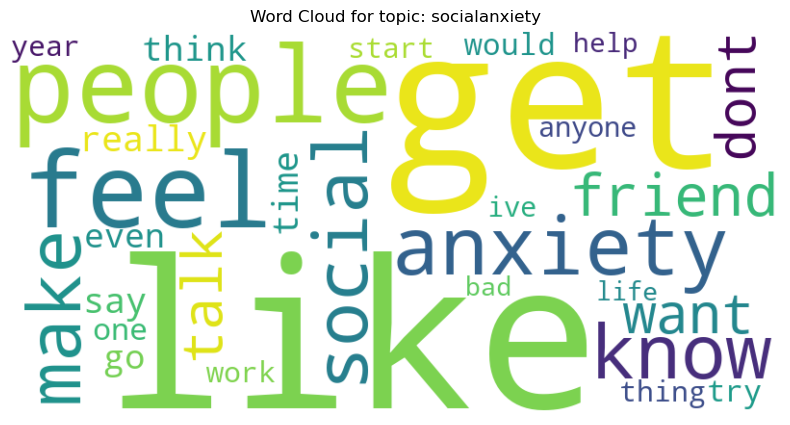

In [33]:
# Creating word clouds for each topic
for topic, words in top_words_per_topic.items():
    word_freq = dict(words)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
    
    # Displaying the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"Word Cloud for topic: {topic}")
    plt.axis('off')
    plt.show()

In [34]:
# Displaying the descriptive statistics
print("Descriptive Statistics:")
print(df_sampled_cleaned['subreddit'].value_counts())
print(df_sampled_cleaned['period'].value_counts())

Descriptive Statistics:
subreddit
depression       7983
anxiety          7956
fitness          7942
mentalhealth     7927
socialanxiety    7804
meditation       7648
lonely           7082
healthanxiety    5692
Name: count, dtype: int64
period
post    43699
pre     16335
Name: count, dtype: int64


## Number of Posts per Period
- This section creates a bar plot to visualize the number of posts during the 'pre' and 'post' periods.
- The plot helps in comparing the volume of discussions before and after significant events, such as the onset of the COVID-19 pandemic.
- Understanding the distribution of posts across these periods provides insights into how public engagement with mental health topics has changed over time.

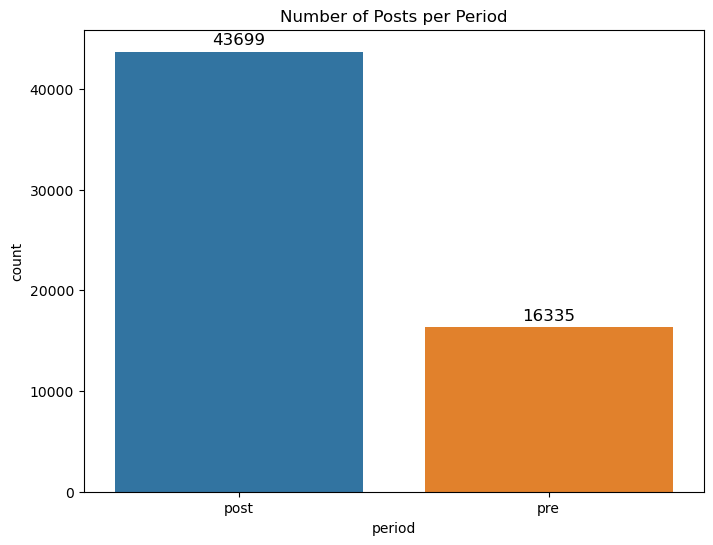

In [35]:
plt.figure(figsize=(8, 6))
ax = sns.countplot(data=df_sampled_cleaned, x='period', order=df_sampled_cleaned['period'].value_counts().index)

for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5),
                textcoords='offset points')
plt.title('Number of Posts per Period')
plt.show()

The significant increase in the number of posts during the post-COVID period reflects the heightened awareness and discussion of mental health issues during the pandemic. The isolation, stress, and uncertainty caused by COVID-19 led many individuals to seek support and share their experiences online, resulting in a higher volume of posts. This trend underscores the important role online communities played in providing mental health support during a time when traditional support systems were less accessible.

## Distribution of Post Lengths
- This section analyzes the distribution of post lengths in terms of the number of characters.
- A histogram is plotted to visualize the frequency of posts of varying lengths, providing insights into the typical post length and identifying any outliers or trends in how users write about mental health topics.

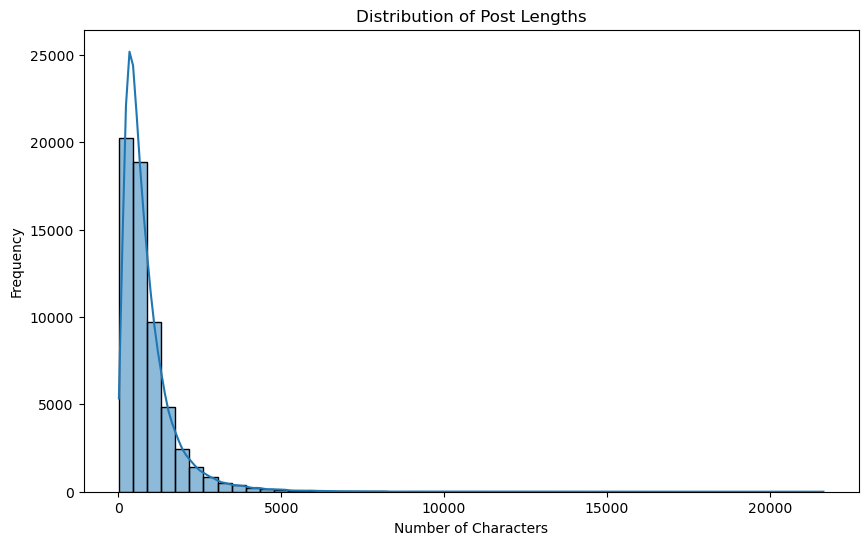

In [36]:
df_sampled_cleaned['post_length'] = df_sampled_cleaned['post'].apply(len)

plt.figure(figsize=(10, 6))
sns.histplot(df_sampled_cleaned['post_length'], bins=50, kde=True)
plt.title('Distribution of Post Lengths')
plt.xlabel('Number of Characters')
plt.ylabel('Frequency')
plt.show()

## Average Sentiment Polarity by Subreddit
- This section calculates and visualizes the average sentiment polarity for each mental health-related subreddit.
- The polarity scores, which range from -1 (negative) to 1 (positive), are averaged across posts within each subreddit.
- A horizontal bar plot is used to display these average polarity scores, allowing for easy comparison of sentiment across different mental health topics. This analysis highlights which topics tend to have more positive or negative discussions.

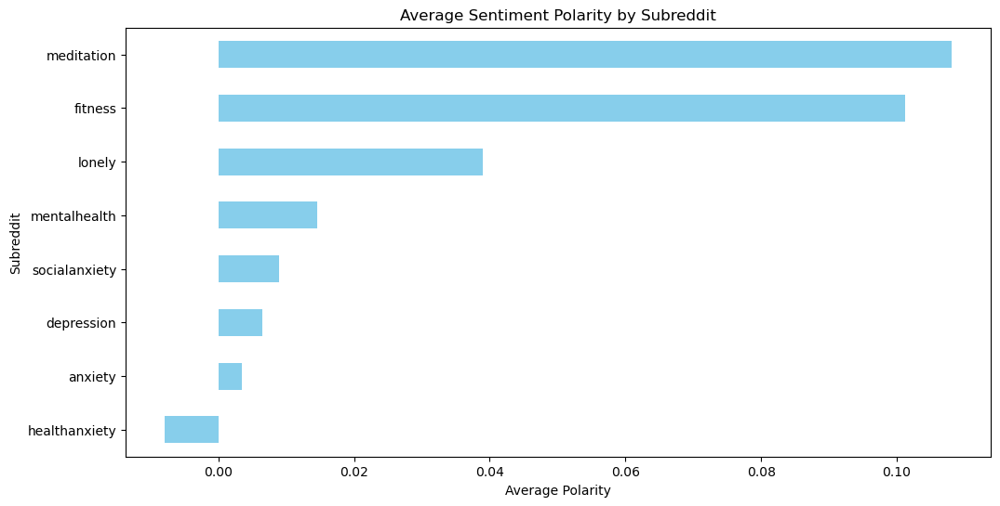

In [37]:
avg_sentiment_by_subreddit = df_sampled_cleaned.groupby('subreddit')['polarity'].mean().sort_values()

plt.figure(figsize=(12, 6))
avg_sentiment_by_subreddit.plot(kind='barh', color='skyblue')
plt.title('Average Sentiment Polarity by Subreddit')
plt.xlabel('Average Polarity')
plt.ylabel('Subreddit')
plt.show()

## Sentiment Distribution by Subreddit
- This section visualizes the distribution of sentiment (positive, negative, neutral) across different mental health-related subreddits.
- A stacked bar plot is used to show the count of each sentiment category within each subreddit, providing a clear comparison of how sentiment varies by topic. 
- This analysis helps to identify which subreddits have more positive or negative discussions, offering insights into the emotional tone of different mental health communities.

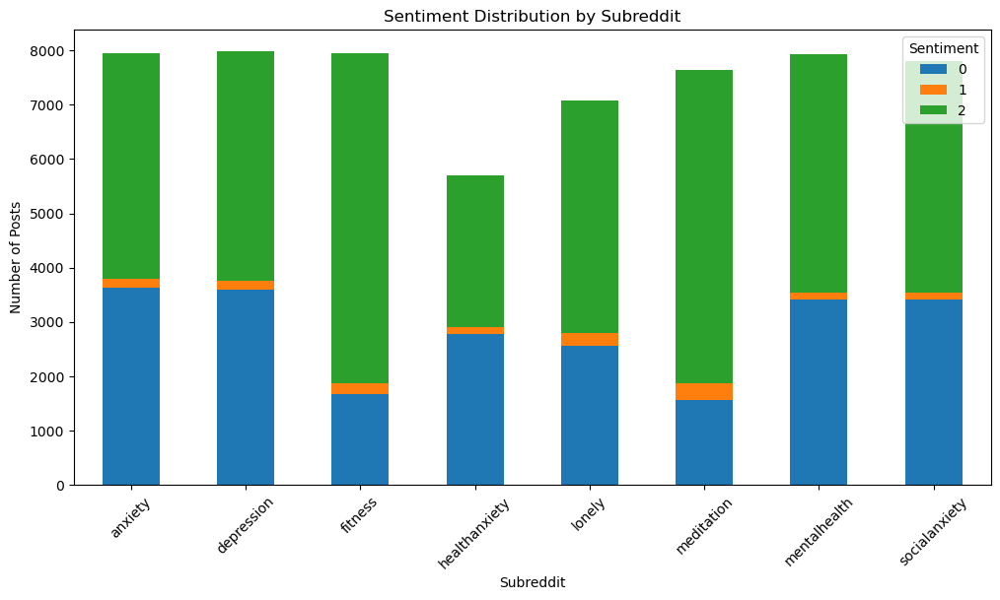

In [38]:
sentiment_counts = df_sampled_cleaned.groupby(['subreddit', 'sentiment']).size().unstack(fill_value=0)

sentiment_counts.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Sentiment Distribution by Subreddit')
plt.xlabel('Subreddit')
plt.ylabel('Number of Posts')
plt.xticks(rotation=45)
plt.legend(title='Sentiment')
plt.show()

- General Sentiment: Most subreddits show a predominance of positive sentiment, indicating that discussions often lean toward supportive and encouraging content.
- Variation Across Subreddits: Some subreddits, like healthanxiety and lonely, have a slightly higher proportion of negative sentiment, reflecting the more challenging topics discussed in these communities.
- Fitness and Mental Health: Subreddits focused on fitness and mentalhealth show a strong positive sentiment, likely due to posts related to self-improvement and recovery stories.
- Smaller Neutral Sentiment: Across all subreddits, neutral sentiment posts are less frequent, suggesting that most discussions evoke strong positive or negative reactions.

### Objective 1: Development of an Advanced Unsupervised Machine Learning Model: Construct a comprehensive unsupervised machine learning model specifically designed to decipher the nuances in public opinion related to mental health. This model will integrate sophisticated techniques such as topic modelling and clustering, enabling it to effectively navigate and interpret complex patterns found within extensive social media datasets.

## Topic Modelling

## 1. LDA (Latent Dirichlet Allocation)
- In this section, Latent Dirichlet Allocation (LDA) is applied to the text data to discover hidden topics within the posts.
- The process begins with TF-IDF vectorization to convert the cleaned text into a matrix of term frequencies.
- LDA is then performed on this matrix to identify a specified number of topics, each represented by a set of words.
- The display_topics function is used to print out the top words associated with each topic, providing insights into the main themes discussed across the mental health-related subreddits.
- Additionally, word clouds are generated for each topic to visually represent the top words in a more intuitive manner.
- The size of each word in the word cloud reflects its significance within the topic, making it easier to identify the key themes and terms associated with each topic.

In [39]:
# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
tfidf = tfidf_vectorizer.fit_transform(df_sampled_cleaned['clean_post'])

In [40]:
# Applying LDA to the TF-IDF matrix
num_topics = 10
lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda.fit(tfidf)

LatentDirichletAllocation(random_state=42)

In [41]:
# Displaying the top words in each topic
def display_topics(model, feature_names, no_top_words):
    topics = {}
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx}:")
        topic_words = ", ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]])
        print(topic_words)
        topics[topic_idx] = topic_words
    return topics

num_top_words = 10
tfidf_feature_names = tfidf_vectorizer.get_feature_names_out()
topics = display_topics(lda, tfidf_feature_names, num_top_words)

Topic 0:
chat, discord, game, talk, birthday, video, lonely, want, people, play
Topic 1:
cbd, oil, capsule, residential, scent, jiu, jitsu, php, emdr, gaba
Topic 2:
node, lymph, lump, skin, cancer, rabies, swollen, worried, neck, throat
Topic 3:
friend, people, talk, feel, like, want, dont, social, make, know
Topic 4:
meditation, meditate, thought, focus, mind, feel, like, practice, experience, try
Topic 5:
weight, workout, gym, muscle, lift, day, exercise, week, eat, fat
Topic 6:
feel, like, want, know, dont, life, time, anxiety, make, really
Topic 7:
iam, code, discount, athleanx, bowflex, cream, vlog, whit, sled, ross
Topic 8:
haircut, barber, phlegm, gong, fart, android, esophageal, insulin, tampon, imgur
Topic 9:
anxiety, feel, attack, pain, heart, symptom, doctor, like, panic, day


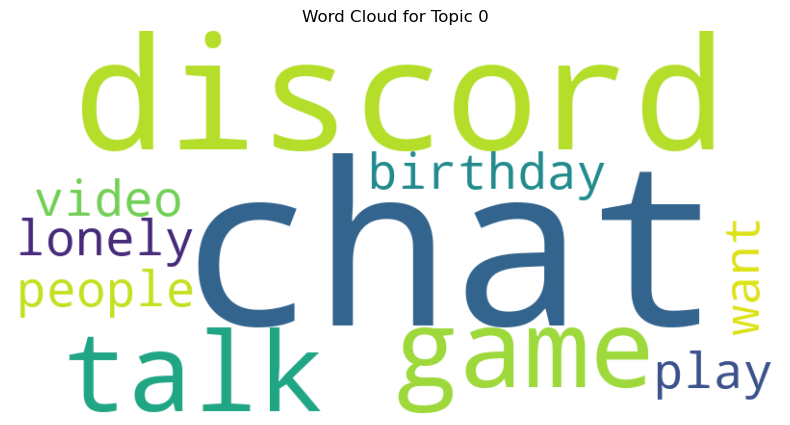

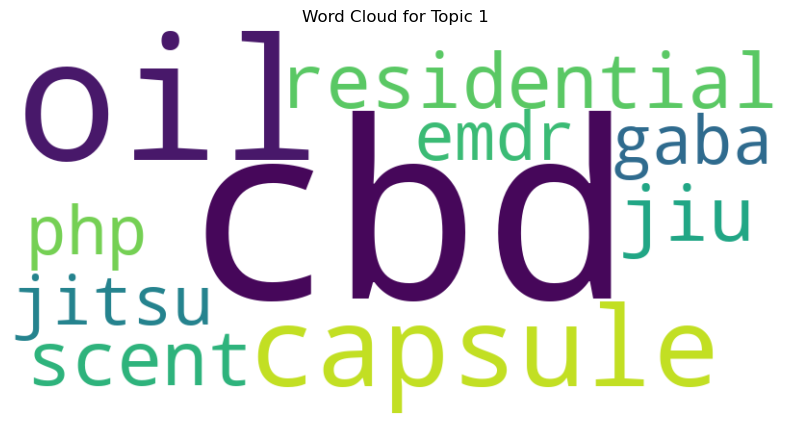

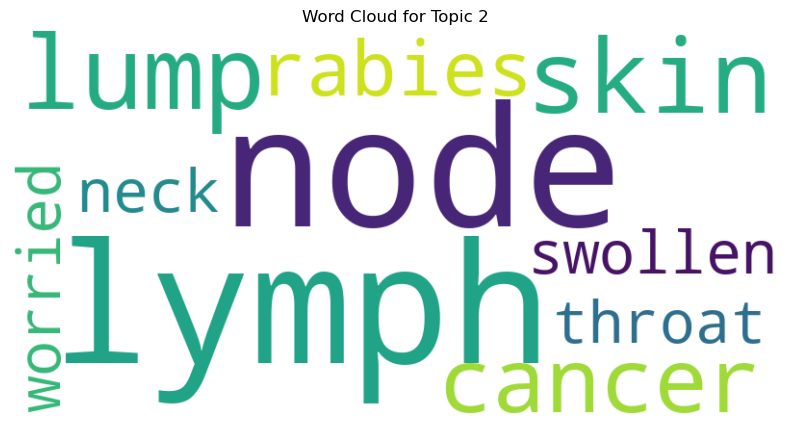

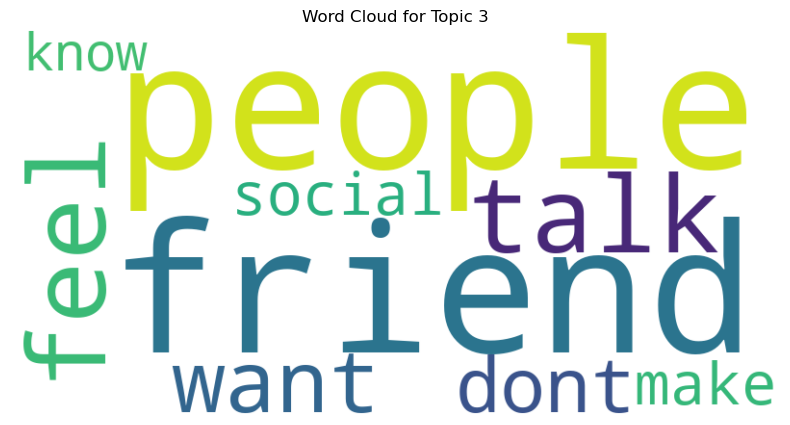

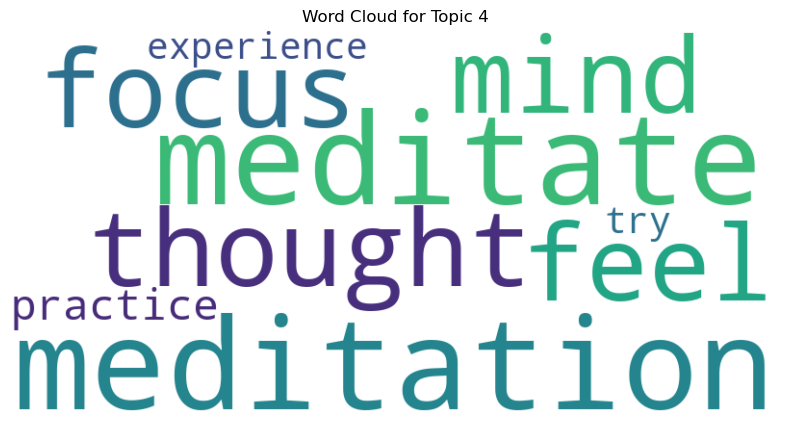

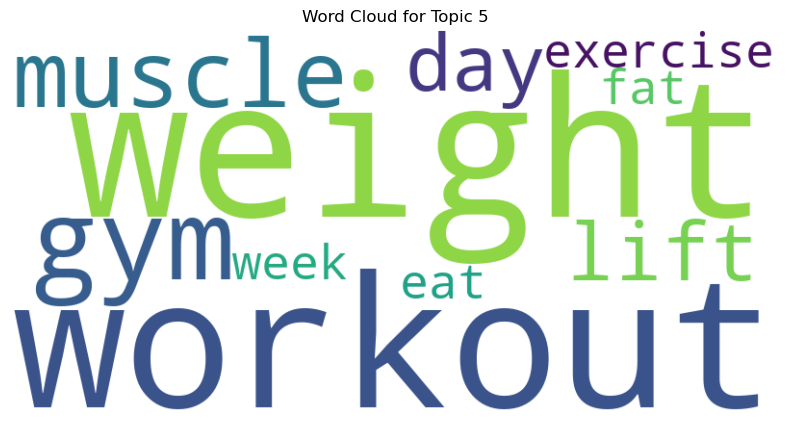

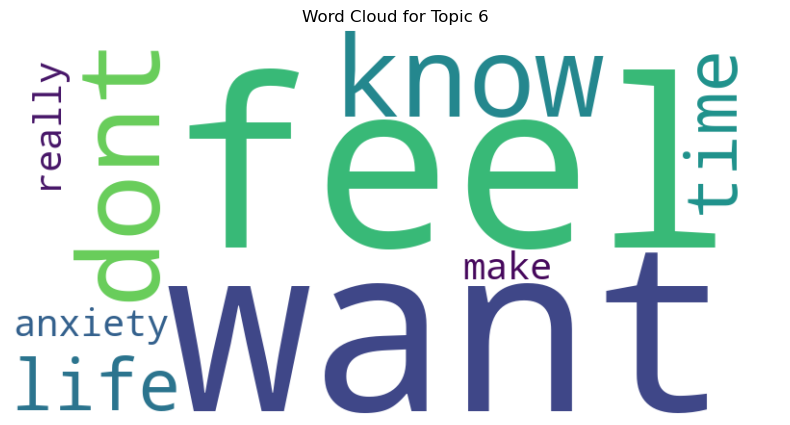

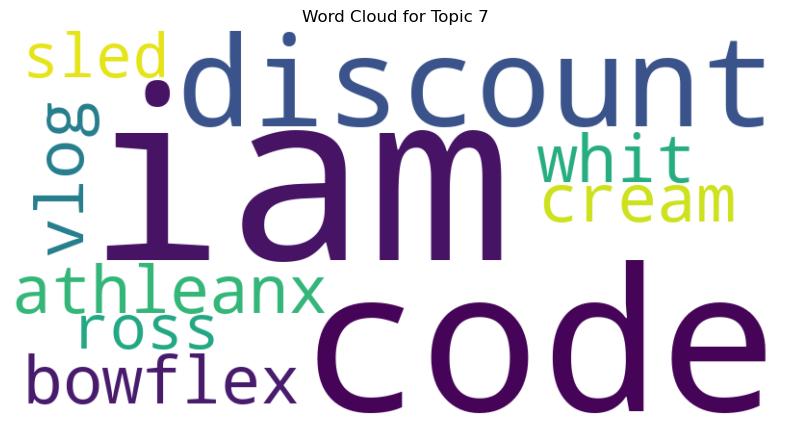

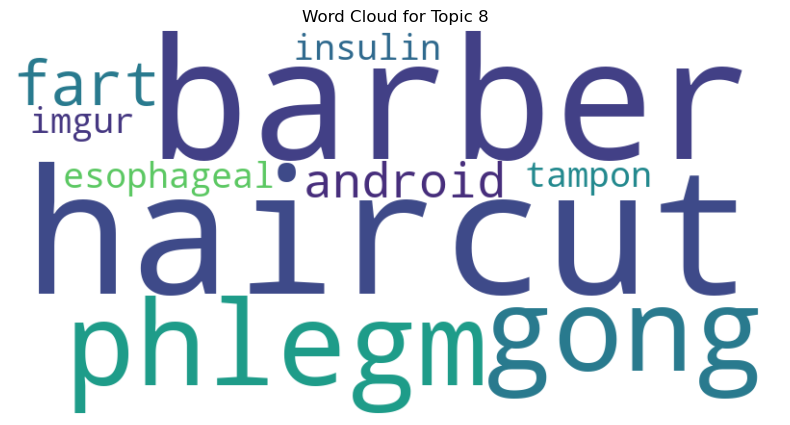

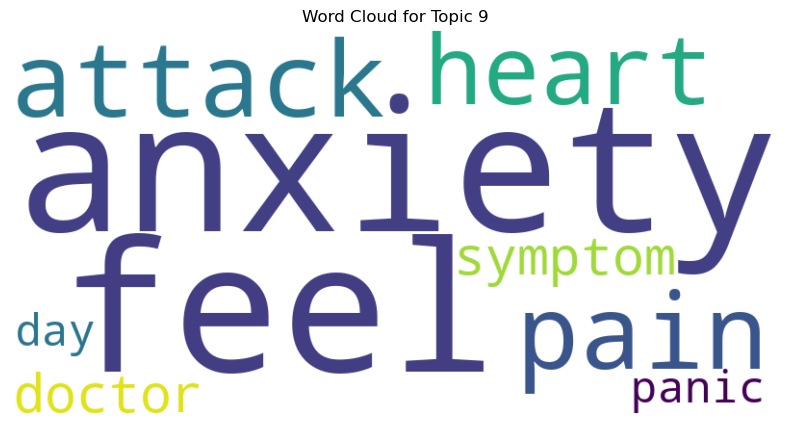

In [42]:
# Visualizing the top words in each topic using word clouds
for topic_idx, topic_words in topics.items():
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(topic_words)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Topic {topic_idx}')
    plt.axis('off')
    plt.show()

In [43]:
# Assigning topics to documents
topic_values = lda.transform(tfidf)
df_sampled_cleaned['Topic'] = topic_values.argmax(axis=1)

In [44]:
print(df_sampled_cleaned[['clean_post', 'Topic']])

                                              clean_post  Topic
0      could bullying childhood cause issue adulthood...      6
1      zoloft side effect question recently start tak...      9
2      anyone else overthink thing harmful extent go ...      6
3      welcome back anxiety also disturb feel gut com...      6
4      dont know related anxiety feel like feel physi...      9
...                                                  ...    ...
61277  stayed home alone family water park celebrate ...      6
61278  anxious visit parent relative another country ...      6
61279  girlfriend broke avoid play cranium go girlfri...      6
61280  advice get people look judging every tiny deta...      3
61281  people keep job always get told soft spoken in...      3

[60034 rows x 2 columns]


### Temporal Analysis of topics generated from LDA
- This plot illustrates the distribution of topics over time as identified by the LDA model. 
- This stacked line plot helps in visualizing the temporal evolution of the topics, indicating which topics were more prominent during specific periods.
- This analysis is useful for identifying trends, such as spikes in discussion around certain topics during particular time frames.


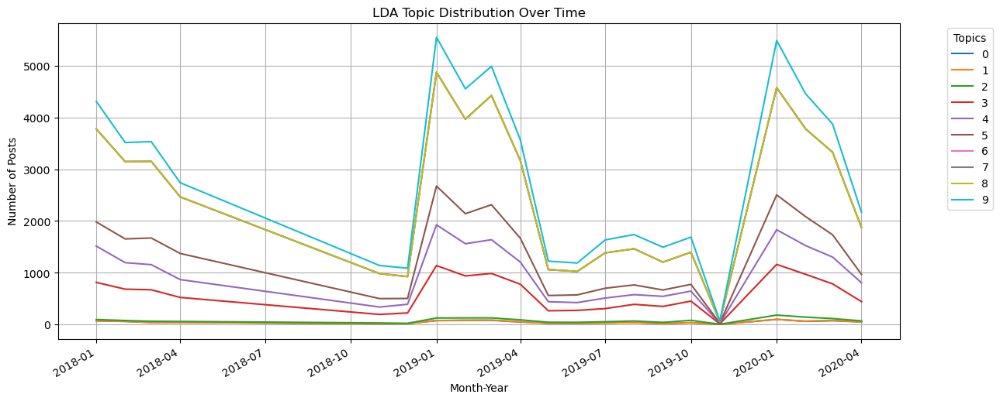

In [98]:
# Group data by 'month_year' and 'Topic'
topics_over_time = df_sampled_cleaned.groupby(['month_year', 'Topic']).size().unstack(fill_value=0)

# Plot the topic distribution over time
plt.figure(figsize=(14, 6))
topics_over_time.plot(kind='line', stacked=True, ax=plt.gca())
plt.title('LDA Topic Distribution Over Time')
plt.xlabel('Month-Year')
plt.ylabel('Number of Posts')
plt.legend(title='Topics', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


## Model Performace Evaluation

### 1. Coherence Score

In [45]:
# Prepare the data for Gensim
texts = [doc.split() for doc in df_sampled_cleaned['clean_post']]
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# Convert sklearn's LDA model to a format compatible with Gensim
lda_gensim = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary,
                                             num_topics=10, passes=10,
                                             alpha='auto', eta='auto')

# Compute Coherence Score using c_v measure
coherence_model_lda = CoherenceModel(model=lda_gensim, texts=texts, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score (c_v): ', coherence_lda)


Coherence Score (c_v):  0.4573522221728771


### 2. Topic Diversity

In [46]:
# Function to calculate topic diversity
def calculate_topic_diversity(topics, num_top_words):
    unique_words = set()
    total_words = 0
    
    for topic in topics.values():
        words = topic.split()
        unique_words.update(words)
        total_words += len(words)
    
    topic_diversity = len(unique_words) / total_words
    return topic_diversity

topic_diversity = calculate_topic_diversity(topics, num_top_words=5)
print(f"Topic Diversity for LDA: {topic_diversity}")

Topic Diversity for LDA: 0.87


## K-Means Clustering with LDA

#### Document-Topic Matrix and Elbow Method

- Document-Topic Distribution: Transforms the LDA model output into a document-topic distribution matrix.
- Elbow Method: Determines the optimal number of clusters (k) by plotting the inertia (within-cluster sum of squares) against different values of k (from 2 to 14). The "elbow" point suggests the best k.


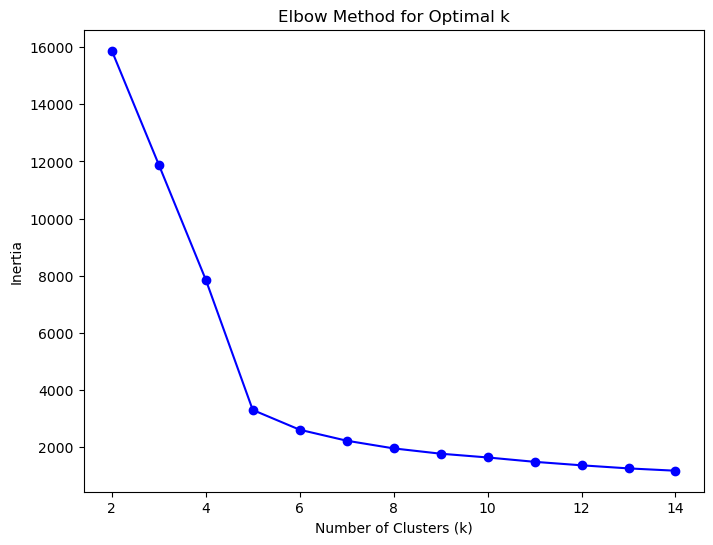

In [47]:
# document-topic distribution matrix
topic_matrix = lda.transform(tfidf) 

# Elbow Method to find the optimal number of clusters
inertia = []
k_values = range(2, 15)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(topic_matrix)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Curve
plt.figure(figsize=(8, 6))
plt.plot(k_values, inertia, 'bo-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

#### Applying K-Means with Optimal Clusters

- Optimal k Selection: Based on the Elbow Method, the optimal number of clusters (k) is selected (k=5).
- K-Means Clustering: Applies the K-Means algorithm with the chosen k to the document-topic matrix and assigns cluster labels to each document.

In [55]:
optimal_k = 5

# Applying KMeans with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df_sampled_cleaned['Cluster'] = kmeans.fit_predict(topic_matrix)

#### Visualization with t-SNE

- t-SNE Visualization: Reduces the dimensionality of the document-topic matrix to 2D using t-SNE and plots the clusters to visually interpret the separation of topics.

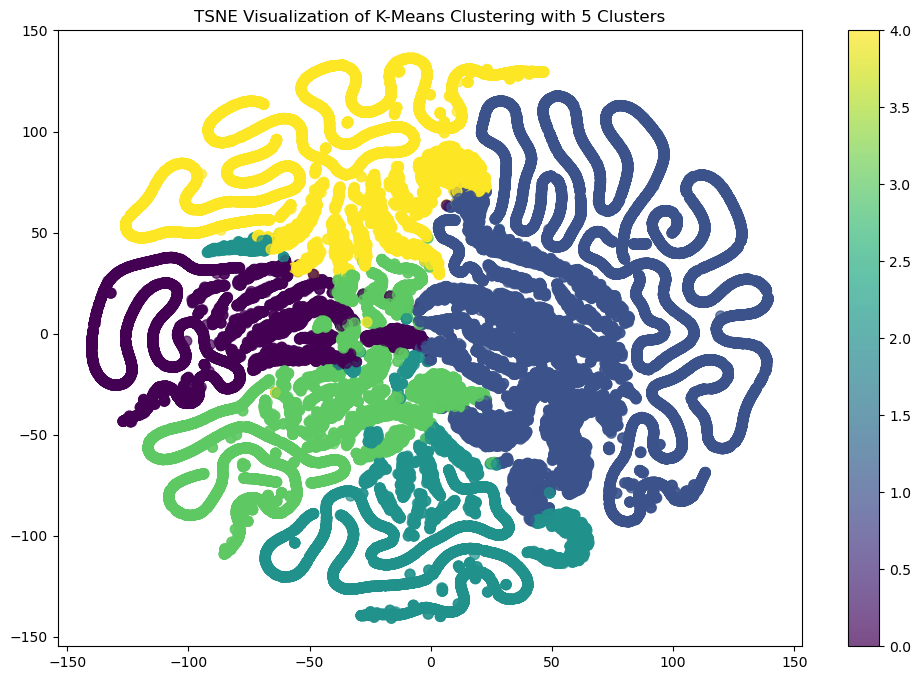

                                          clean_post  Cluster
0  could bullying childhood cause issue adulthood...        1
1  zoloft side effect question recently start tak...        3
2  anyone else overthink thing harmful extent go ...        1
3  welcome back anxiety also disturb feel gut com...        1
4  dont know related anxiety feel like feel physi...        3


In [56]:
# Visualizing the clusters
tsne_model = TSNE(n_components=2, random_state=42)
tsne_lda = tsne_model.fit_transform(topic_matrix)

plt.figure(figsize=(12, 8))
plt.scatter(tsne_lda[:, 0], tsne_lda[:, 1], c=df_sampled_cleaned['Cluster'], cmap='viridis', s=50, alpha=0.7)
plt.colorbar()
plt.title(f'TSNE Visualization of K-Means Clustering with {optimal_k} Clusters')
plt.show()

# Analyzing and interpreting the clusters
print(df_sampled_cleaned[['clean_post', 'Cluster']].head())

In [57]:
kmeans_labels = kmeans.fit_predict(topic_matrix)

silhouette_avg = silhouette_score(topic_matrix, kmeans_labels)
print(f'Silhouette Score for K-Means clustering: {silhouette_avg}')

Silhouette Score for K-Means clustering: 0.7228476083029173


#### Cluster Analysis and Interpretation

- Dominant Topic Identification: Identifies the most dominant topic in each cluster based on the document-topic distribution.
- Cluster Insights: Analyzes each cluster by finding the most common dominant topic and listing the top words associated with that topic, providing insights into the themes of each cluster.
- Sample Documents: Displays sample documents from each cluster to better understand the nature of the discussions within that cluster.

In [58]:
# Adding dominant topic for each document
df_sampled_cleaned['Dominant_Topic'] = np.argmax(topic_matrix, axis=1)

# Analyzing the dominant topics in each cluster
for cluster_num in range(optimal_k):
    print(f"Cluster {cluster_num}:")
    
    # Get the subset of the data that belongs to the current cluster
    cluster_docs = df_sampled_cleaned[df_sampled_cleaned['Cluster'] == cluster_num]
    
    # Find the most common dominant topic in this cluster
    most_common_topic = cluster_docs['Dominant_Topic'].value_counts().idxmax()
    
    print(f"Most common dominant topic: {most_common_topic}")
    
    # Display the top words for this topic
    print("Top words in this topic:")
    print(topics[most_common_topic])


Cluster 0:
Most common dominant topic: 5
Top words in this topic:
weight, workout, gym, muscle, lift, day, exercise, week, eat, fat
Cluster 1:
Most common dominant topic: 6
Top words in this topic:
feel, like, want, know, dont, life, time, anxiety, make, really
Cluster 2:
Most common dominant topic: 4
Top words in this topic:
meditation, meditate, thought, focus, mind, feel, like, practice, experience, try
Cluster 3:
Most common dominant topic: 9
Top words in this topic:
anxiety, feel, attack, pain, heart, symptom, doctor, like, panic, day
Cluster 4:
Most common dominant topic: 3
Top words in this topic:
friend, people, talk, feel, like, want, dont, social, make, know


## 2. BERTopic (Bidirectional Encoder Representations from Transformers for Topic Modeling)

- In this section, BERTopic, an advanced topic modeling technique, is applied to the text data to identify and analyze hidden topics within the posts.
- BERTopic leverages Transformer-based embeddings, specifically BERT (Bidirectional Encoder Representations from Transformers), to capture the contextual meaning of words, leading to more coherent and contextually accurate topics.
- The process begins with converting the cleaned text into document embeddings using BERT, followed by dimensionality reduction and clustering to discover topics.
- BERTopic not only identifies topics but also provides probabilities for each topic, allowing for a nuanced understanding of the distribution of topics within each document.
- This method enables the extraction of highly relevant topics that reflect the complexity of the discussions within the mental health-related subreddits.
- Additionally, BERTopic's ability to merge similar topics further refines the topic model, resulting in a concise set of distinct topics that represent the core themes of the dataset.


In [60]:
documents = df_sampled_cleaned['clean_post'].tolist()

In [61]:
# Initialize BERTopic
topic_model = BERTopic(language="english", calculate_probabilities=True, verbose=True)

# Fit the BERTopic model to your data
topics, probabilities = topic_model.fit_transform(documents)

2024-09-01 14:01:18,733 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1877 [00:00<?, ?it/s]

2024-09-01 14:03:23,340 - BERTopic - Embedding - Completed ✓
2024-09-01 14:03:23,341 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-09-01 14:03:41,192 - BERTopic - Dimensionality - Completed ✓
2024-09-01 14:03:41,194 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current p

In [62]:
# Step 3: Review the topics generated
topic_info = topic_model.get_topic_info()
print(topic_info)

     Topic  Count                                           Name  \
0       -1  31616                       -1_feel_like_friend_life   
1        0   7998                      0_weight_workout_gym_lift   
2        1   1007          1_zoloft_medication_effect_prescribed   
3        2    815            2_eye_meditate_sensation_meditation   
4        3    799                    3_suicide_kill_suicidal_die   
..     ...    ...                                            ...   
320    319     10                  319_jaw_clench_teeth_clenched   
321    320     10             320_bdd_flaw_dysmorphia_dysmorphic   
322    321     10                321_red_face_beetroot_slightest   
323    322     10       322_college_social_depresed_anywayssssss   
324    323     10  323_entrepreneur_disadvantage_motivation_fail   

                                        Representation  \
0    [feel, like, friend, life, people, know, get, ...   
1    [weight, workout, gym, lift, muscle, squat, fa...   
2    [zol

In [63]:
# Visualize the topics
topic_model.visualize_topics()

In [64]:
# Add the identified topics to your DataFrame
df_sampled_cleaned['BERTopic'] = topics

In [65]:
# Reduce the number of topics by merging similar ones
topic_model = topic_model.reduce_topics(documents, nr_topics=10)  # Reduce to 10 topics, for example

# Review the new topic distribution
topic_info = topic_model.get_topic_info()
print(topic_info)

2024-09-01 14:08:23,113 - BERTopic - Topic reduction - Reducing number of topics
2024-09-01 14:08:24,568 - BERTopic - Topic reduction - Reduced number of topics from 325 to 10


   Topic  Count                                Name  \
0     -1  31616               -1_feel_like_get_know   
1      0  17350                0_feel_like_get_know   
2      1   8013            1_weight_gym_day_workout   
3      2   2677             2_pain_get_anxiety_feel   
4      3    134              3_scar_nail_tattoo_cut   
5      4     90            4_order_food_get_chicken   
6      5     62  5_headspace_code_free_subscription   
7      6     54           6_hug_cuddle_want_someone   
8      7     20               7_tire_want_kill_feel   
9      8     18          8_ampx200b_guitar_amp_play   

                                      Representation  \
0  [feel, like, get, know, want, time, dont, make...   
1  [feel, like, get, know, anxiety, want, time, p...   
2  [weight, gym, day, workout, lift, muscle, week...   
3  [pain, get, anxiety, feel, heart, go, doctor, ...   
4  [scar, nail, tattoo, cut, finger, get, feel, k...   
5  [order, food, get, chicken, go, say, ask, eat,...   
6 

In [66]:
topic_model.visualize_topics()

In [67]:
# Step 1: Bar Chart Visualization
topic_model.visualize_barchart(top_n_topics=10)

In [68]:
# Hierarchical Visualization
topic_model.visualize_hierarchy(top_n_topics=10)

In [69]:
topic_model.visualize_term_rank()

## Model Performance Evaluation

### 1. Coherence Score

In [70]:
# Step 1: Extract topics from the reduced BERTopic model
topics = topic_model.get_topics()

# Extract the words for each topic, ignoring the topic ID -1 which is for outliers
topic_words = []
for topic_id, topic in topics.items():
    if topic_id != -1:  
        words = [word for word, _ in topic]
        topic_words.append(words)

# Step 2: Prepare the data for coherence calculation
texts = [doc.split() for doc in df_sampled_cleaned['clean_post']]
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# Step 3: Calculate Coherence Score using Gensim
coherence_model = CoherenceModel(topics=topic_words, texts=texts, dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()
print(f"Coherence Score for BERTopic (with 10 topics): {coherence_score}")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Coherence Score for BERTopic (with 10 topics): 0.41095082764753665


### 2. Topic Diversity Score

In [71]:
# Step 4: Calculate Topic Diversity
unique_words = set()
total_words = 0
for topic in topic_words:
    unique_words.update(topic)
    total_words += len(topic)

topic_diversity = len(unique_words) / total_words
print(f"Topic Diversity for BERTopic: {topic_diversity}")

Topic Diversity for BERTopic: 0.7777777777777778


### Temporal Analysis of topics generated from BERTopic
- Temporal analysis is performed by converting the 'month_year' column to a timestamp, enabling the tracking of topics over time.
- The `visualize_topics_over_time()` function is then used to visualize how the prevalence of different topics has evolved over the specified periods, offering insights into how discussions around various mental health issues have shifted throughout the pandemic.

In [72]:
# Convert 'month_year' from Period to Timestamp
df_sampled_cleaned['month_year'] = df_sampled_cleaned['month_year'].dt.to_timestamp()

# 'month_year' column is used for temporal analysis
topics_over_time = topic_model.topics_over_time(df_sampled_cleaned['clean_post'], df_sampled_cleaned['month_year'], global_tuning=True)

# Visualizing topics over time
topic_model.visualize_topics_over_time(topics_over_time)

21it [00:08,  2.60it/s]


## Clustering Techniques

### 1. HDBSCAN Clustering

In [74]:
text_data = df_sampled_cleaned['clean_post'].tolist()
# Use Sentence Transformers to get embeddings for clustering
model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = model.encode(text_data, show_progress_bar=True)
# Apply HDBSCAN to the embeddings
clusterer = hdbscan.HDBSCAN(min_cluster_size=15, metric='euclidean', cluster_selection_method='eom', prediction_data=True)
cluster_labels = clusterer.fit_predict(embeddings)

# Add the cluster labels to your dataframe
df_sampled_cleaned['cluster'] = cluster_labels

Batches:   0%|          | 0/1877 [00:00<?, ?it/s]

In [75]:
# Explore the number of clusters formed and their sizes
print(f"Number of clusters: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(pd.Series(cluster_labels).value_counts())

Number of clusters: 2
-1    50278
 0     9738
 1       18
Name: count, dtype: int64


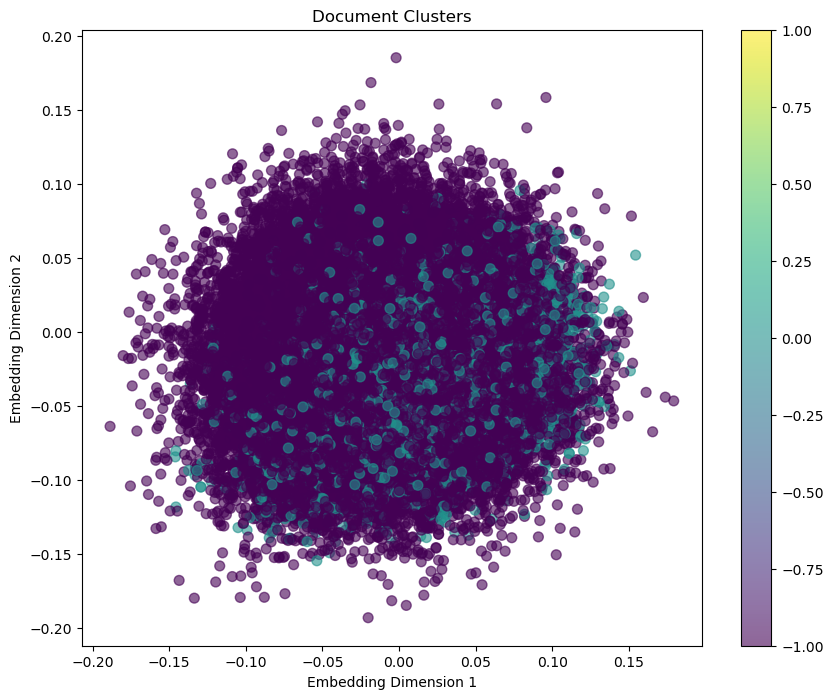

In [76]:
# Visualizing the clusters

plt.figure(figsize=(10, 8))
scatter = plt.scatter(embeddings[:, 0], embeddings[:, 1], c=cluster_labels, cmap='viridis', s=50, alpha=0.6)
plt.colorbar(scatter)
plt.title('Document Clusters')
plt.xlabel('Embedding Dimension 1')
plt.ylabel('Embedding Dimension 2')
plt.show()

In [77]:
# Calculate the silhouette score for HDBSCAN
hdbscan_silhouette_score = silhouette_score(embeddings, cluster_labels)
print(f"Silhouette Score for HDBSCAN clustering: {hdbscan_silhouette_score}")

Silhouette Score for HDBSCAN clustering: -0.031392745673656464


In [82]:
# Davies-Bouldin Index for HDBSCAN
hdbscan_db_index = davies_bouldin_score(embeddings, cluster_labels)
print(f'Davies-Bouldin Index for HDBSCAN: {hdbscan_db_index}')

Davies-Bouldin Index for HDBSCAN: 4.750621916293465


### 2. K-Means Clustering

In [78]:
num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(embeddings)

# Adding the K-Means cluster labels to your DataFrame
df_sampled_cleaned['KMeans_Cluster'] = kmeans_labels

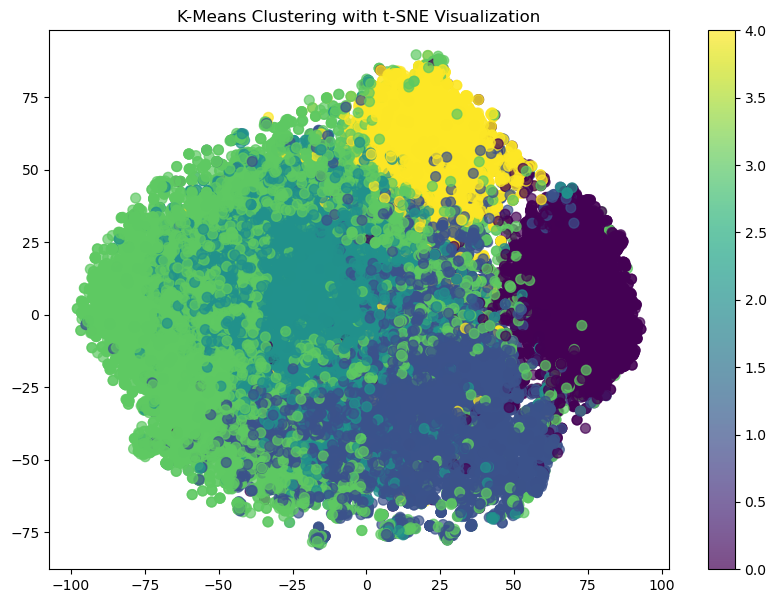

In [79]:
tsne_model = TSNE(n_components=2, random_state=42)
tsne_embeddings = tsne_model.fit_transform(embeddings)

plt.figure(figsize=(10, 7))
plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], c=kmeans_labels, cmap='viridis', s=50, alpha=0.7)
plt.colorbar()
plt.title('K-Means Clustering with t-SNE Visualization')
plt.show()

In [80]:
# Calculate the silhouette score for K-Means
kmeans_silhouette_score = silhouette_score(embeddings, kmeans_labels)
print(f"Silhouette Score for K-Means clustering: {kmeans_silhouette_score}")

Silhouette Score for K-Means clustering: 0.054565973579883575


In [83]:
# Davies-Bouldin Index for K-Means
kmeans_db_index = davies_bouldin_score(embeddings, kmeans_labels)
print(f'Davies-Bouldin Index for K-Means: {kmeans_db_index}')

Davies-Bouldin Index for K-Means: 3.5398727666098893


## Temporal Analysis

### Granular Temporal Analysis: Track Changes Over Time
This section focuses on performing a detailed temporal analysis of sentiment scores to observe changes over time.

1. Aggregate sentiment scores by 'month_year'
- The sentiment scores are aggregated by month-year to calculate the average sentiment for each month.
- This aggregation allows for the identification of trends in sentiment over the specified time period.

2. Plot the average sentiment scores over time
- The plot highlights how sentiment has evolved over time, providing insights into the overall trend.

In [89]:
# Initialize VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Apply sentiment analysis to each post
df_sampled_cleaned['SentimentIntensity'] = df_sampled_cleaned['clean_post'].apply(lambda x: analyzer.polarity_scores(x)['compound'])

In [90]:
# Function to categorize sentiment
def categorize_sentiment(score):
    if score >= 0.05:
        return 'positive'
    elif score <= -0.05:
        return 'negative'
    else:
        return 'neutral'


In [91]:
# Categorize sentiment
df_sampled_cleaned['sentiment_category'] = df_sampled_cleaned['SentimentIntensity'].apply(categorize_sentiment)

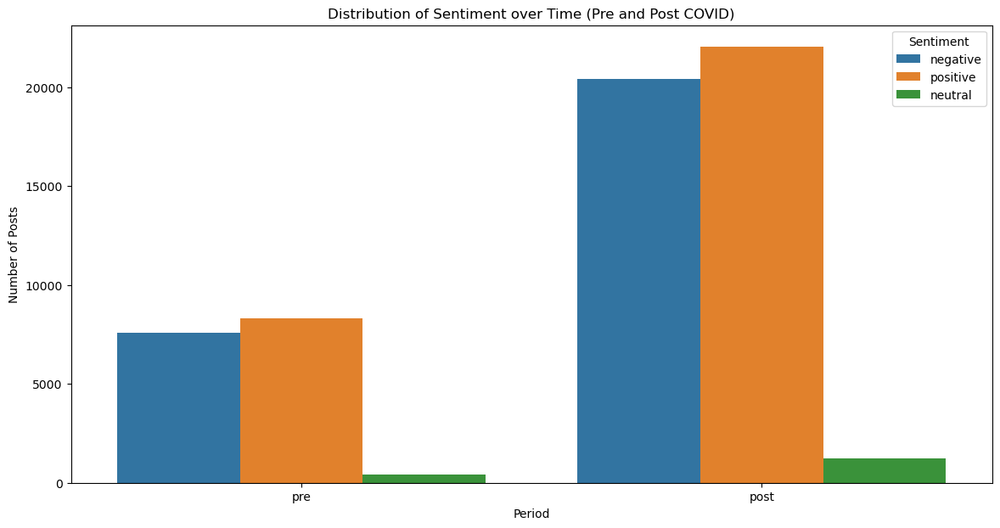

In [92]:
plt.figure(figsize=(14, 7))
sns.countplot(data=df_sampled_cleaned, x='period', hue='sentiment_category')
plt.title('Distribution of Sentiment over Time (Pre and Post COVID)')
plt.xlabel('Period')
plt.ylabel('Number of Posts')
plt.legend(title='Sentiment')
plt.show()


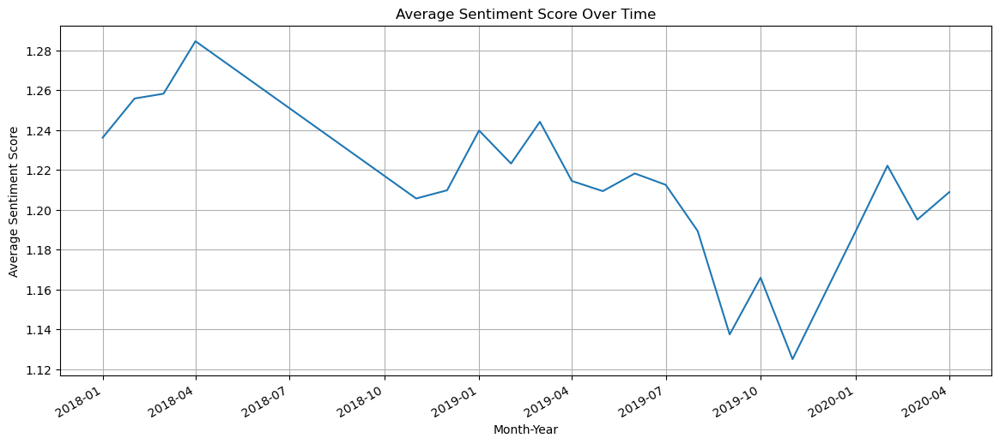

In [84]:
# Aggregate sentiment scores by 'month_year'
monthly_sentiment = df_sampled_cleaned.groupby('month_year')['sentiment'].mean()

# Plot the average sentiment scores over time
plt.figure(figsize=(14, 6))
monthly_sentiment.plot()
plt.title('Average Sentiment Score Over Time')
plt.xlabel('Month-Year')
plt.ylabel('Average Sentiment Score')
plt.grid(True)
plt.show()

### Correlation with Social Events
This section focuses on analyzing the correlation between social events (like the first lockdown) and the sentiment scores over time.

1. Define the social event
- The social_events dictionary stores important social events with their corresponding dates.
- Here, the date of the first lockdown (March 2020) is defined as a key event to analyze its impact on sentiment.

2. Aggregate sentiment scores by 'month_year'
- The sentiment scores are grouped by 'month_year' to calculate the average sentiment score for each month.
- This aggregation allows us to observe the trend in sentiment over time.

3. Plot the average sentiment scores over time
- A line plot is generated to visualize the average sentiment scores from January 2018 to April 2020.
- This plot helps in identifying any significant changes or trends in sentiment over time.


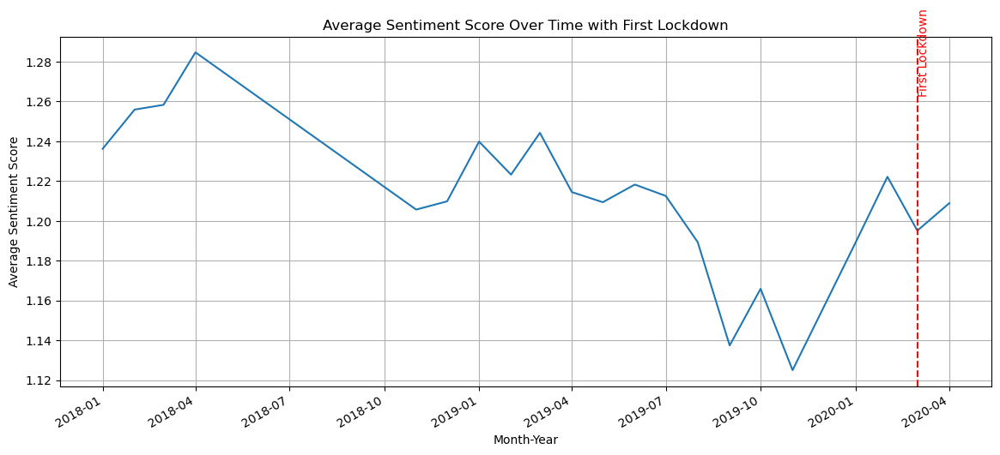

In [85]:
# Define the social event
social_events = {
    '2020-03': 'First Lockdown',
}

# Aggregate sentiment scores by 'month_year'
monthly_sentiment = df_sampled_cleaned.groupby('month_year')['sentiment'].mean()

# Plot the average sentiment scores over time
plt.figure(figsize=(14, 6))
monthly_sentiment.plot()
plt.title('Average Sentiment Score Over Time with First Lockdown')
plt.xlabel('Month-Year')
plt.ylabel('Average Sentiment Score')

# Annotate the plot with the first lockdown event
for event_date, event_name in social_events.items():
    plt.axvline(pd.to_datetime(event_date), color='red', linestyle='--')
    plt.text(pd.to_datetime(event_date), monthly_sentiment.max(), event_name, rotation=90, verticalalignment='center', color='red')

plt.grid(True)
plt.show()


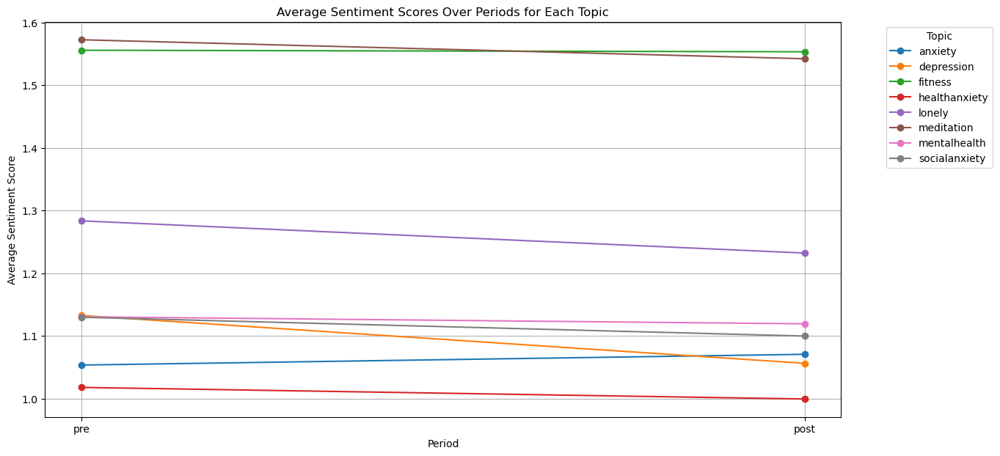

In [86]:
# Calculate average sentiment score for each topic over periods
average_sentiment = df_sampled_cleaned.groupby(['subreddit', 'period'])['sentiment'].mean().unstack()

# Reorder the columns to have 'pre' before 'post'
average_sentiment = average_sentiment[['pre', 'post']]

# Plotting the average sentiment scores over periods for each topic
plt.figure(figsize=(14, 7))
for topic in average_sentiment.index:
    plt.plot(average_sentiment.columns, average_sentiment.loc[topic], marker='o', label=topic)

plt.title('Average Sentiment Scores Over Periods for Each Topic')
plt.xlabel('Period')
plt.ylabel('Average Sentiment Score')
plt.legend(title='Topic', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

## Conclusion

- This dissertation analyzed the impact of the COVID-19 pandemic on mental health using data from various subreddits. By applying techniques like sentiment analysis, topic modeling, and clustering, we uncovered significant trends in online discussions.

- Key findings include a general decline in sentiment during the pandemic, with increased discussions around anxiety, depression, and health-related topics. Clustering revealed distinct themes within the data, highlighting shifts in concerns over time. Temporal analysis linked significant events, such as lockdowns, to spikes in negative sentiment, underscoring the pandemic's profound effect on mental well-being.

- These insights provide valuable understanding for mental health professionals and policymakers, illustrating the pandemic's impact on public sentiment and mental health.
